In [2]:
import random



def random_chromosome(size): #generating random input ranging from 0 to 7 

    return [ random.randint(0, nq-1) for _ in range(nq) ]



def fitness(chromosome):

    horizontal_collisions = sum([chromosome.count(queen)-1 for queen in chromosome])/2

    diagonal_collisions = 0



    n = len(chromosome)

    left_diagonal = [0] * 2*n

    right_diagonal = [0] * 2*n

    for i in range(n):

        left_diagonal[i + chromosome[i] - 1] += 1

        right_diagonal[len(chromosome) - i + chromosome[i] - 2] += 1



    diagonal_collisions = 0

    for i in range(2*n-1):

        counter = 0

        if left_diagonal[i] > 1:

            counter += left_diagonal[i]-1

        if right_diagonal[i] > 1:

            counter += right_diagonal[i]-1

        diagonal_collisions += counter / (n-abs(i-n+1))

    

    return int(maxFitness - (horizontal_collisions + diagonal_collisions)) #28-(2+3)=23



def probability(chromosome, fitness):

    return fitness(chromosome) / maxFitness



def random_pick(population, probabilities):

    populationWithProbabilty = zip(population, probabilities)

    total = sum(w for c, w in populationWithProbabilty)

    r = random.uniform(0, total)

    upto = 0

    for c, w in zip(population, probabilities):

        if upto + w >= r:

            return c

        upto += w

    assert False, "Shouldn't get here"

        

def reproduce(x, y): #doing cross_over between two chromosomes

    n = len(x)

    c = random.randint(0, n - 1)

    return x[0:c] + y[c:n]



def mutate(x):  #randomly changing the value of a random index of a chromosome

    n = len(x)

    c = random.randint(0, n - 1)

    m = random.randint(1, n)

    x[c] = m

    return x



def genetic_queen(population, fitness):

    mutation_probability = 0.03

    new_population = []

    probabilities = [probability(n, fitness) for n in population]

    for i in range(len(population)):

        x = random_pick(population, probabilities) #best chromosome 1

        y = random_pick(population, probabilities) #best chromosome 2

        child = reproduce(x, y) #creating two new chromosomes from the best 2 chromosomes

        if random.random() < mutation_probability:

            child = mutate(child)

        print_chromosome(child)

        new_population.append(child)

        if fitness(child) == maxFitness: break

    return new_population



def print_chromosome(chrom):

    print("Chromosome = {},  Fitness = {}"

        .format(str(chrom), fitness(chrom)))



if __name__ == "__main__":

    nq = 8 #int(input("Enter Number of Queens: ")) #say N = 8

    maxFitness = (nq*(nq-1))/2  # 8*7/2 = 28

    population = [random_chromosome(nq) for _ in range(100)]

    

    generation = 1



    while not maxFitness in [fitness(chrom) for chrom in population]:

        print("=== Generation {} ===".format(generation))

        population = genetic_queen(population, fitness)

        print("")

        print("Maximum Fitness = {}".format(max([fitness(n) for n in population])))

        generation += 1

    chrom_out = []

    print("Solved in Generation {}!".format(generation-1))

    for chrom in population:

        if fitness(chrom) == maxFitness:

            print("");

            print("One of the solutions: ")

            chrom_out = chrom

            print_chromosome(chrom)

            

    board = []



    for x in range(nq):

        board.append(["x"] * (nq))

        

    for i in range(nq):

        board[(nq-1)-chrom_out[i]][i]="Q"

            



    def print_board(board):

        for row in board:

            print (" ".join(row))

            

    print()

    print_board(board)

=== Generation 1 ===
Chromosome = [1, 3, 1, 4, 0, 5, 2, 7],  Fitness = 26
Chromosome = [5, 3, 5, 2, 5, 4, 7, 3],  Fitness = 23
Chromosome = [2, 4, 1, 5, 7, 1, 6, 5],  Fitness = 25
Chromosome = [2, 1, 6, 6, 4, 1, 7, 7],  Fitness = 24
Chromosome = [5, 4, 6, 5, 7, 2, 6, 3],  Fitness = 25
Chromosome = [4, 6, 0, 7, 7, 6, 5, 0],  Fitness = 24
Chromosome = [4, 3, 1, 7, 6, 3, 0, 2],  Fitness = 26
Chromosome = [0, 5, 0, 7, 2, 4, 5, 2],  Fitness = 24
Chromosome = [5, 7, 4, 4, 6, 0, 1, 7],  Fitness = 25
Chromosome = [2, 4, 1, 7, 3, 0, 2, 2],  Fitness = 24
Chromosome = [1, 7, 0, 5, 7, 1, 7, 6],  Fitness = 23
Chromosome = [7, 2, 3, 2, 6, 3, 5, 0],  Fitness = 25
Chromosome = [2, 4, 0, 3, 2, 4, 0, 4],  Fitness = 21
Chromosome = [6, 4, 3, 0, 5, 5, 0, 4],  Fitness = 24
Chromosome = [3, 3, 7, 7, 0, 3, 2, 1],  Fitness = 23
Chromosome = [2, 7, 6, 2, 3, 1, 0, 1],  Fitness = 24
Chromosome = [2, 0, 6, 2, 0, 5, 0, 1],  Fitness = 22
Chromosome = [4, 7, 3, 7, 3, 0, 2, 2],  Fitness = 23
Chromosome = [1, 0, 0, 2,

Chromosome = [6, 3, 1, 4, 6, 3, 2, 1],  Fitness = 24
Chromosome = [2, 1, 7, 5, 3, 0, 0, 3],  Fitness = 25
Chromosome = [2, 4, 0, 0, 5, 3, 2, 0],  Fitness = 23
Chromosome = [2, 1, 7, 5, 3, 0, 0, 0],  Fitness = 24
Chromosome = [6, 4, 4, 1, 6, 2, 5, 2],  Fitness = 24
Chromosome = [6, 3, 0, 7, 6, 3, 3, 2],  Fitness = 23
Chromosome = [0, 2, 6, 5, 7, 5, 4, 0],  Fitness = 25
Chromosome = [6, 4, 4, 4, 5, 6, 4, 0],  Fitness = 20
Chromosome = [6, 1, 4, 6, 1, 6, 1, 1],  Fitness = 18
Chromosome = [6, 4, 3, 8, 3, 7, 1, 5],  Fitness = 26
Chromosome = [3, 3, 4, 6, 7, 6, 4, 0],  Fitness = 24
Chromosome = [2, 4, 6, 5, 7, 2, 2, 7],  Fitness = 23
Chromosome = [6, 1, 2, 7, 0, 3, 2, 1],  Fitness = 25
Chromosome = [2, 1, 4, 4, 2, 6, 6, 3],  Fitness = 23
Chromosome = [3, 4, 7, 0, 5, 3, 2, 3],  Fitness = 23
Chromosome = [0, 3, 2, 7, 4, 3, 4, 1],  Fitness = 24
Chromosome = [0, 4, 3, 0, 6, 2, 5, 2],  Fitness = 25
Chromosome = [4, 7, 4, 7, 4, 5, 3, 4],  Fitness = 20
Chromosome = [0, 3, 2, 7, 4, 3, 4, 1],  Fitnes

Chromosome = [0, 1, 3, 0, 5, 5, 3, 1],  Fitness = 23
Chromosome = [0, 1, 4, 7, 7, 7, 3, 1],  Fitness = 23
Chromosome = [0, 4, 4, 4, 6, 2, 6, 1],  Fitness = 23
Chromosome = [2, 4, 1, 7, 4, 1, 2, 1],  Fitness = 22
Chromosome = [0, 6, 4, 2, 4, 1, 6, 7],  Fitness = 25
Chromosome = [4, 6, 4, 4, 6, 2, 2, 3],  Fitness = 22
Chromosome = [6, 4, 4, 0, 5, 2, 6, 7],  Fitness = 25
Chromosome = [4, 6, 3, 4, 4, 1, 3, 1],  Fitness = 22
Chromosome = [0, 3, 5, 7, 2, 7, 3, 1],  Fitness = 25
Chromosome = [0, 4, 0, 7, 2, 7, 3, 1],  Fitness = 25
Chromosome = [4, 6, 4, 0, 7, 5, 3, 1],  Fitness = 26
Chromosome = [6, 0, 4, 2, 6, 2, 2, 0],  Fitness = 22
Chromosome = [0, 4, 4, 4, 4, 1, 2, 1],  Fitness = 20
Chromosome = [4, 6, 0, 7, 4, 1, 6, 7],  Fitness = 24
Chromosome = [0, 6, 5, 0, 6, 5, 3, 1],  Fitness = 24
Chromosome = [7, 4, 4, 7, 7, 5, 6, 1],  Fitness = 23
Chromosome = [4, 4, 3, 4, 2, 7, 4, 0],  Fitness = 21
Chromosome = [2, 4, 1, 1, 7, 2, 6, 3],  Fitness = 25
Chromosome = [6, 4, 4, 4, 6, 1, 4, 0],  Fitnes

Chromosome = [7, 6, 3, 0, 5, 5, 6, 1],  Fitness = 25
Chromosome = [2, 1, 1, 0, 6, 3, 6, 2],  Fitness = 23
Chromosome = [2, 0, 1, 4, 4, 3, 6, 1],  Fitness = 25
Chromosome = [2, 4, 1, 0, 6, 7, 6, 8],  Fitness = 26
Chromosome = [6, 4, 1, 0, 4, 5, 6, 3],  Fitness = 25
Chromosome = [4, 6, 4, 2, 4, 5, 7, 2],  Fitness = 23
Chromosome = [0, 1, 3, 0, 6, 7, 3, 0],  Fitness = 23
Chromosome = [6, 0, 5, 7, 2, 5, 3, 8],  Fitness = 26
Chromosome = [7, 4, 5, 0, 2, 6, 6, 2],  Fitness = 25
Chromosome = [4, 1, 3, 0, 6, 6, 6, 1],  Fitness = 23
Chromosome = [4, 6, 5, 2, 4, 7, 3, 1],  Fitness = 26
Chromosome = [0, 4, 3, 0, 2, 1, 6, 1],  Fitness = 25
Chromosome = [0, 6, 4, 7, 4, 7, 3, 2],  Fitness = 25
Chromosome = [2, 6, 1, 0, 6, 7, 7, 0],  Fitness = 24
Chromosome = [0, 4, 0, 0, 7, 6, 3, 5],  Fitness = 24
Chromosome = [2, 1, 1, 0, 7, 6, 3, 5],  Fitness = 25
Chromosome = [7, 0, 5, 1, 7, 7, 3, 0],  Fitness = 23
Chromosome = [7, 4, 5, 0, 2, 1, 6, 1],  Fitness = 26
Chromosome = [0, 1, 3, 2, 4, 1, 6, 1],  Fitnes

Chromosome = [6, 4, 5, 4, 2, 1, 6, 2],  Fitness = 24
Chromosome = [2, 4, 5, 0, 4, 7, 6, 2],  Fitness = 25
Chromosome = [4, 0, 3, 0, 6, 2, 6, 2],  Fitness = 24
Chromosome = [0, 0, 3, 0, 4, 7, 3, 8],  Fitness = 23
Chromosome = [6, 0, 3, 6, 6, 1, 6, 1],  Fitness = 20
Chromosome = [4, 0, 3, 0, 4, 7, 6, 2],  Fitness = 25
Chromosome = [2, 4, 3, 0, 2, 7, 6, 1],  Fitness = 26
Chromosome = [0, 4, 5, 0, 4, 7, 3, 2],  Fitness = 25
Chromosome = [4, 4, 1, 0, 6, 7, 3, 2],  Fitness = 26
Chromosome = [5, 6, 5, 0, 4, 2, 6, 8],  Fitness = 25
Chromosome = [6, 4, 5, 6, 4, 5, 6, 2],  Fitness = 22
Chromosome = [6, 4, 5, 0, 4, 7, 7, 2],  Fitness = 25
Chromosome = [6, 4, 3, 0, 4, 7, 3, 1],  Fitness = 25
Chromosome = [6, 4, 3, 6, 6, 7, 6, 8],  Fitness = 21
Chromosome = [4, 0, 3, 6, 6, 2, 7, 0],  Fitness = 25
Chromosome = [0, 0, 3, 6, 6, 2, 7, 0],  Fitness = 23
Chromosome = [6, 4, 5, 6, 4, 7, 4, 2],  Fitness = 23
Chromosome = [2, 4, 1, 6, 6, 5, 6, 2],  Fitness = 23
Chromosome = [0, 4, 3, 4, 8, 2, 6, 0],  Fitnes

Chromosome = [5, 4, 3, 0, 6, 2, 6, 1],  Fitness = 26
Chromosome = [5, 6, 3, 0, 4, 5, 6, 2],  Fitness = 25
Chromosome = [5, 4, 1, 6, 4, 7, 6, 8],  Fitness = 25
Chromosome = [4, 4, 1, 0, 6, 2, 6, 1],  Fitness = 24
Chromosome = [2, 4, 1, 2, 4, 7, 3, 8],  Fitness = 25
Chromosome = [8, 0, 3, 0, 2, 7, 3, 8],  Fitness = 24
Chromosome = [5, 4, 1, 0, 4, 2, 2, 0],  Fitness = 23
Chromosome = [4, 4, 2, 6, 2, 7, 6, 1],  Fitness = 24
Chromosome = [8, 0, 3, 0, 6, 2, 7, 5],  Fitness = 26
Chromosome = [4, 0, 1, 2, 4, 2, 6, 8],  Fitness = 25
Chromosome = [4, 0, 1, 0, 2, 7, 2, 0],  Fitness = 23

Maximum Fitness = 27
=== Generation 59 ===
Chromosome = [8, 0, 5, 0, 2, 2, 3, 4],  Fitness = 25
Chromosome = [4, 4, 2, 6, 6, 7, 6, 8],  Fitness = 23
Chromosome = [5, 0, 1, 0, 2, 7, 6, 0],  Fitness = 24
Chromosome = [5, 0, 1, 0, 2, 7, 6, 8],  Fitness = 26
Chromosome = [4, 0, 1, 2, 2, 7, 6, 8],  Fitness = 26
Chromosome = [2, 4, 1, 0, 6, 2, 6, 1],  Fitness = 24
Chromosome = [6, 4, 2, 7, 6, 2, 7, 1],  Fitness = 24
Ch

Chromosome = [4, 0, 1, 5, 4, 7, 6, 1],  Fitness = 25
Chromosome = [8, 0, 3, 2, 4, 2, 2, 0],  Fitness = 23
Chromosome = [4, 6, 3, 0, 2, 7, 3, 8],  Fitness = 26
Chromosome = [4, 7, 1, 6, 6, 2, 6, 0],  Fitness = 24
Chromosome = [4, 0, 1, 6, 4, 2, 2, 8],  Fitness = 25
Chromosome = [5, 0, 1, 0, 4, 2, 2, 0],  Fitness = 22
Chromosome = [5, 1, 3, 6, 2, 7, 7, 4],  Fitness = 26
Chromosome = [5, 0, 3, 5, 4, 7, 6, 1],  Fitness = 26
Chromosome = [4, 0, 1, 6, 4, 2, 7, 4],  Fitness = 24
Chromosome = [2, 4, 1, 2, 2, 7, 6, 0],  Fitness = 24
Chromosome = [4, 0, 3, 2, 4, 7, 6, 1],  Fitness = 26
Chromosome = [4, 0, 2, 6, 6, 2, 2, 0],  Fitness = 22
Chromosome = [4, 1, 3, 0, 2, 7, 3, 0],  Fitness = 25
Chromosome = [4, 6, 3, 0, 2, 2, 7, 8],  Fitness = 26
Chromosome = [4, 1, 3, 0, 2, 7, 6, 1],  Fitness = 26
Chromosome = [5, 0, 3, 0, 2, 2, 2, 0],  Fitness = 21
Chromosome = [4, 0, 3, 2, 6, 2, 6, 8],  Fitness = 25
Chromosome = [5, 4, 3, 0, 2, 7, 3, 1],  Fitness = 26
Chromosome = [4, 0, 3, 0, 4, 7, 6, 8],  Fitnes

Chromosome = [4, 6, 3, 0, 2, 2, 6, 0],  Fitness = 24
Chromosome = [4, 7, 1, 0, 6, 7, 6, 8],  Fitness = 25
Chromosome = [4, 6, 3, 0, 2, 2, 6, 8],  Fitness = 25
Chromosome = [5, 6, 3, 8, 2, 2, 2, 0],  Fitness = 24
Chromosome = [4, 0, 1, 0, 6, 2, 2, 8],  Fitness = 25

Maximum Fitness = 27
=== Generation 88 ===
Chromosome = [4, 0, 2, 0, 6, 2, 6, 8],  Fitness = 24
Chromosome = [4, 6, 3, 0, 4, 7, 2, 0],  Fitness = 25
Chromosome = [4, 0, 3, 2, 2, 7, 2, 4],  Fitness = 23
Chromosome = [5, 6, 3, 0, 4, 7, 6, 0],  Fitness = 25
Chromosome = [5, 7, 3, 0, 2, 7, 2, 8],  Fitness = 25
Chromosome = [4, 0, 1, 0, 6, 2, 2, 8],  Fitness = 25
Chromosome = [4, 6, 3, 0, 2, 2, 6, 8],  Fitness = 25
Chromosome = [5, 7, 3, 6, 2, 2, 2, 8],  Fitness = 24
Chromosome = [4, 1, 3, 0, 2, 2, 2, 8],  Fitness = 24
Chromosome = [5, 7, 3, 0, 6, 7, 6, 1],  Fitness = 25
Chromosome = [5, 6, 3, 0, 4, 7, 6, 8],  Fitness = 26
Chromosome = [5, 7, 3, 0, 6, 7, 2, 0],  Fitness = 25
Chromosome = [5, 0, 3, 0, 2, 7, 5, 8],  Fitness = 25
Ch

Chromosome = [4, 6, 3, 0, 2, 7, 2, 0],  Fitness = 25
Chromosome = [4, 6, 3, 6, 2, 7, 5, 8],  Fitness = 26
Chromosome = [5, 6, 3, 7, 2, 7, 2, 0],  Fitness = 25
Chromosome = [5, 1, 3, 6, 4, 7, 2, 8],  Fitness = 27
Chromosome = [5, 6, 3, 0, 6, 7, 2, 0],  Fitness = 25
Chromosome = [5, 6, 3, 6, 6, 7, 2, 0],  Fitness = 24
Chromosome = [5, 0, 3, 8, 4, 7, 2, 0],  Fitness = 26
Chromosome = [4, 0, 1, 0, 2, 8, 6, 8],  Fitness = 25
Chromosome = [4, 0, 3, 3, 4, 2, 2, 0],  Fitness = 23
Chromosome = [5, 6, 3, 5, 2, 7, 2, 0],  Fitness = 25
Chromosome = [4, 0, 3, 0, 6, 7, 5, 8],  Fitness = 26
Chromosome = [5, 6, 3, 0, 4, 2, 2, 8],  Fitness = 25
Chromosome = [4, 0, 1, 0, 6, 7, 2, 0],  Fitness = 24
Chromosome = [4, 0, 1, 0, 4, 2, 6, 8],  Fitness = 25
Chromosome = [4, 6, 3, 0, 4, 7, 2, 8],  Fitness = 26
Chromosome = [5, 6, 3, 0, 6, 7, 2, 0],  Fitness = 25
Chromosome = [5, 6, 3, 6, 2, 7, 2, 1],  Fitness = 25
Chromosome = [4, 0, 3, 6, 2, 7, 2, 0],  Fitness = 26
Chromosome = [4, 6, 3, 0, 6, 7, 2, 0],  Fitnes

Chromosome = [5, 0, 3, 0, 4, 7, 2, 8],  Fitness = 26
Chromosome = [5, 6, 3, 6, 6, 7, 6, 8],  Fitness = 21
Chromosome = [5, 6, 1, 6, 6, 7, 5, 4],  Fitness = 23
Chromosome = [5, 6, 3, 0, 6, 7, 6, 0],  Fitness = 23
Chromosome = [4, 0, 3, 0, 6, 7, 5, 4],  Fitness = 25
Chromosome = [8, 6, 3, 0, 6, 7, 6, 8],  Fitness = 23
Chromosome = [5, 0, 3, 0, 2, 1, 6, 0],  Fitness = 24
Chromosome = [8, 6, 1, 6, 4, 2, 2, 0],  Fitness = 25
Chromosome = [5, 0, 3, 0, 6, 7, 2, 0],  Fitness = 24
Chromosome = [5, 6, 3, 0, 2, 7, 2, 0],  Fitness = 25
Chromosome = [5, 0, 3, 0, 6, 7, 6, 0],  Fitness = 23
Chromosome = [5, 6, 3, 8, 2, 2, 5, 8],  Fitness = 23
Chromosome = [5, 6, 3, 6, 4, 7, 6, 0],  Fitness = 24
Chromosome = [5, 6, 1, 6, 6, 2, 6, 8],  Fitness = 21
Chromosome = [5, 6, 3, 6, 2, 7, 2, 0],  Fitness = 25
Chromosome = [5, 6, 1, 8, 6, 7, 7, 8],  Fitness = 24
Chromosome = [5, 6, 1, 0, 4, 7, 6, 8],  Fitness = 26
Chromosome = [5, 6, 3, 6, 6, 7, 6, 8],  Fitness = 21
Chromosome = [5, 6, 3, 0, 6, 2, 2, 0],  Fitnes

Chromosome = [5, 0, 3, 0, 6, 7, 3, 5],  Fitness = 24
Chromosome = [4, 6, 3, 6, 4, 7, 6, 0],  Fitness = 23
Chromosome = [5, 0, 3, 0, 6, 7, 6, 0],  Fitness = 23

Maximum Fitness = 27
=== Generation 127 ===
Chromosome = [5, 1, 3, 6, 4, 7, 2, 8],  Fitness = 27
Chromosome = [5, 6, 3, 0, 6, 7, 2, 8],  Fitness = 26
Chromosome = [5, 1, 3, 6, 4, 7, 6, 0],  Fitness = 26
Chromosome = [5, 0, 3, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [4, 1, 3, 8, 4, 7, 2, 4],  Fitness = 24
Chromosome = [5, 6, 3, 8, 4, 7, 2, 0],  Fitness = 27
Chromosome = [5, 0, 3, 0, 4, 7, 6, 8],  Fitness = 26
Chromosome = [4, 6, 3, 8, 4, 7, 6, 8],  Fitness = 24
Chromosome = [5, 6, 1, 0, 6, 7, 5, 4],  Fitness = 24
Chromosome = [5, 0, 3, 0, 8, 7, 6, 5],  Fitness = 25
Chromosome = [5, 6, 1, 0, 6, 7, 5, 0],  Fitness = 23
Chromosome = [5, 6, 1, 0, 6, 7, 6, 3],  Fitness = 23
Chromosome = [5, 0, 3, 8, 4, 7, 6, 8],  Fitness = 26
Chromosome = [5, 0, 3, 0, 6, 7, 2, 0],  Fitness = 24
Chromosome = [5, 6, 3, 8, 6, 7, 3, 5],  Fitness = 23
C

Chromosome = [5, 0, 3, 8, 4, 7, 6, 4],  Fitness = 25
Chromosome = [5, 6, 3, 8, 6, 7, 2, 8],  Fitness = 25
Chromosome = [5, 6, 3, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 6, 3, 8, 4, 7, 3, 5],  Fitness = 25
Chromosome = [5, 0, 3, 8, 4, 7, 6, 8],  Fitness = 26
Chromosome = [5, 0, 3, 8, 6, 7, 2, 5],  Fitness = 26
Chromosome = [5, 6, 2, 0, 4, 7, 6, 4],  Fitness = 24
Chromosome = [5, 0, 3, 8, 6, 7, 6, 0],  Fitness = 25
Chromosome = [5, 6, 3, 8, 4, 7, 6, 4],  Fitness = 24
Chromosome = [5, 1, 3, 8, 6, 7, 6, 8],  Fitness = 24
Chromosome = [5, 0, 3, 8, 6, 7, 5, 0],  Fitness = 25
Chromosome = [5, 1, 3, 8, 4, 7, 2, 8],  Fitness = 26
Chromosome = [5, 0, 3, 8, 4, 7, 6, 0],  Fitness = 26
Chromosome = [5, 0, 3, 8, 4, 7, 2, 0],  Fitness = 26
Chromosome = [5, 1, 3, 8, 4, 7, 2, 0],  Fitness = 27
Chromosome = [7, 0, 3, 8, 6, 7, 6, 0],  Fitness = 24
Chromosome = [5, 1, 3, 0, 4, 7, 6, 0],  Fitness = 26
Chromosome = [5, 0, 3, 0, 6, 7, 2, 0],  Fitness = 24
Chromosome = [7, 6, 3, 8, 6, 7, 2, 0],  Fitnes

Chromosome = [5, 1, 3, 8, 6, 5, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 6, 4, 7, 2, 4],  Fitness = 26
Chromosome = [5, 0, 2, 0, 6, 7, 6, 4],  Fitness = 25
Chromosome = [5, 1, 6, 8, 4, 7, 1, 4],  Fitness = 25
Chromosome = [5, 1, 3, 8, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 0, 3, 8, 6, 7, 1, 4],  Fitness = 27
Chromosome = [5, 0, 3, 8, 6, 7, 6, 4],  Fitness = 25
Chromosome = [5, 0, 2, 0, 6, 7, 5, 5],  Fitness = 23
Chromosome = [5, 0, 3, 8, 4, 7, 1, 4],  Fitness = 26
Chromosome = [5, 0, 3, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 0, 3, 8, 6, 7, 1, 4],  Fitness = 27
Chromosome = [4, 1, 6, 8, 4, 7, 1, 4],  Fitness = 23
Chromosome = [5, 1, 6, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [4, 1, 3, 8, 4, 7, 1, 5],  Fitness = 25
Chromosome = [5, 6, 2, 0, 6, 7, 2, 0],  Fitness = 24
Chromosome = [5, 0, 3, 8, 6, 7, 2, 8],  Fitness = 26
Chromosome = [4, 1, 3, 8, 6, 7, 5, 5],  Fitness = 26
Chromosome = [5, 1, 6, 8, 4, 7, 1, 4],  Fitness = 25
Chromosome = [5, 8, 3, 3, 6, 7, 1, 4],  Fitnes

Chromosome = [5, 1, 3, 8, 4, 7, 1, 4],  Fitness = 25
Chromosome = [5, 0, 3, 8, 4, 7, 7, 4],  Fitness = 25
Chromosome = [5, 0, 3, 8, 4, 7, 6, 0],  Fitness = 26
Chromosome = [5, 6, 2, 8, 6, 7, 1, 4],  Fitness = 26
Chromosome = [5, 0, 3, 8, 4, 7, 1, 4],  Fitness = 26
Chromosome = [5, 0, 3, 2, 4, 7, 1, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 4, 7, 1, 0],  Fitness = 26
Chromosome = [5, 0, 3, 0, 4, 7, 1, 7],  Fitness = 25
Chromosome = [5, 8, 3, 0, 4, 7, 1, 8],  Fitness = 26
Chromosome = [5, 6, 2, 8, 4, 7, 1, 4],  Fitness = 26
Chromosome = [5, 0, 2, 0, 4, 7, 1, 5],  Fitness = 25
Chromosome = [5, 0, 3, 8, 4, 7, 7, 0],  Fitness = 25
Chromosome = [5, 0, 3, 8, 4, 7, 7, 0],  Fitness = 25
Chromosome = [5, 0, 6, 0, 6, 7, 1, 4],  Fitness = 25
Chromosome = [5, 0, 2, 8, 4, 7, 1, 4],  Fitness = 26
Chromosome = [5, 6, 2, 6, 6, 7, 2, 8],  Fitness = 23
Chromosome = [5, 0, 3, 0, 4, 7, 1, 1],  Fitness = 25
Chromosome = [5, 0, 6, 0, 4, 7, 1, 4],  Fitness = 25
Chromosome = [5, 0, 6, 0, 4, 7, 1, 0],  Fitnes

Chromosome = [5, 0, 2, 8, 4, 5, 1, 4],  Fitness = 25
Chromosome = [5, 1, 3, 0, 4, 7, 1, 4],  Fitness = 25
Chromosome = [5, 1, 3, 0, 4, 7, 6, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 4, 7, 7, 4],  Fitness = 25
Chromosome = [5, 8, 2, 8, 4, 7, 1, 4],  Fitness = 25
Chromosome = [5, 0, 2, 0, 4, 7, 7, 4],  Fitness = 24
Chromosome = [5, 1, 3, 8, 4, 7, 6, 1],  Fitness = 25
Chromosome = [5, 1, 3, 8, 4, 7, 1, 4],  Fitness = 25
Chromosome = [5, 0, 3, 8, 6, 7, 8, 4],  Fitness = 26
Chromosome = [5, 0, 2, 0, 6, 7, 8, 4],  Fitness = 26
Chromosome = [5, 1, 3, 8, 4, 7, 1, 0],  Fitness = 26
Chromosome = [5, 0, 2, 8, 4, 7, 1, 4],  Fitness = 26
Chromosome = [5, 8, 3, 8, 6, 7, 6, 4],  Fitness = 24
Chromosome = [5, 1, 3, 0, 6, 7, 1, 4],  Fitness = 26
Chromosome = [5, 0, 3, 0, 4, 7, 6, 4],  Fitness = 25
Chromosome = [5, 0, 2, 8, 4, 7, 8, 4],  Fitness = 25
Chromosome = [5, 1, 3, 0, 4, 2, 1, 4],  Fitness = 25
Chromosome = [5, 0, 3, 0, 4, 7, 6, 0],  Fitness = 24
Chromosome = [5, 1, 3, 0, 5, 5, 7, 0],  Fitnes

Chromosome = [2, 1, 2, 1, 4, 7, 7, 4],  Fitness = 22
Chromosome = [5, 8, 3, 0, 4, 7, 7, 4],  Fitness = 25
Chromosome = [5, 8, 3, 0, 5, 7, 7, 7],  Fitness = 23
Chromosome = [5, 1, 3, 0, 4, 7, 7, 4],  Fitness = 25
Chromosome = [2, 1, 2, 8, 4, 2, 1, 4],  Fitness = 21
Chromosome = [5, 1, 3, 0, 2, 7, 1, 4],  Fitness = 26
Chromosome = [1, 8, 3, 0, 4, 2, 1, 4],  Fitness = 25
Chromosome = [2, 1, 2, 8, 4, 7, 6, 4],  Fitness = 24
Chromosome = [5, 0, 3, 0, 4, 7, 7, 4],  Fitness = 24
Chromosome = [5, 1, 3, 0, 6, 7, 7, 4],  Fitness = 26
Chromosome = [5, 8, 3, 8, 4, 7, 6, 4],  Fitness = 24
Chromosome = [5, 1, 3, 0, 4, 7, 1, 4],  Fitness = 25
Chromosome = [5, 0, 3, 0, 4, 7, 7, 4],  Fitness = 24
Chromosome = [5, 0, 3, 0, 4, 7, 1, 4],  Fitness = 25
Chromosome = [5, 1, 2, 1, 6, 7, 1, 4],  Fitness = 24
Chromosome = [2, 1, 2, 1, 4, 7, 1, 4],  Fitness = 21
Chromosome = [5, 8, 3, 0, 4, 7, 1, 7],  Fitness = 26
Chromosome = [5, 3, 3, 8, 4, 7, 7, 1],  Fitness = 25
Chromosome = [2, 1, 2, 1, 4, 7, 7, 1],  Fitnes

Chromosome = [5, 1, 3, 8, 4, 7, 1, 4],  Fitness = 25
Chromosome = [5, 1, 3, 0, 4, 7, 7, 4],  Fitness = 25
Chromosome = [1, 0, 3, 0, 4, 2, 7, 4],  Fitness = 24
Chromosome = [5, 8, 3, 8, 4, 7, 7, 4],  Fitness = 24
Chromosome = [5, 1, 2, 3, 4, 5, 1, 4],  Fitness = 24
Chromosome = [5, 0, 3, 0, 4, 5, 1, 7],  Fitness = 25
Chromosome = [5, 1, 2, 6, 4, 5, 1, 4],  Fitness = 24
Chromosome = [5, 1, 3, 0, 4, 5, 1, 4],  Fitness = 24
Chromosome = [5, 1, 3, 8, 4, 7, 1, 4],  Fitness = 25
Chromosome = [5, 0, 2, 0, 6, 7, 1, 7],  Fitness = 25
Chromosome = [5, 1, 2, 0, 4, 2, 1, 7],  Fitness = 25
Chromosome = [5, 0, 2, 0, 4, 7, 7, 4],  Fitness = 24
Chromosome = [5, 1, 3, 0, 4, 7, 7, 4],  Fitness = 25
Chromosome = [5, 1, 3, 8, 4, 8, 1, 4],  Fitness = 24
Chromosome = [5, 1, 3, 0, 4, 5, 2, 4],  Fitness = 25
Chromosome = [5, 0, 2, 0, 4, 7, 1, 4],  Fitness = 25
Chromosome = [5, 1, 3, 0, 4, 8, 1, 4],  Fitness = 25
Chromosome = [5, 8, 3, 0, 4, 5, 1, 4],  Fitness = 25
Chromosome = [5, 1, 2, 0, 6, 7, 1, 4],  Fitnes

=== Generation 224 ===
Chromosome = [5, 1, 3, 8, 4, 7, 1, 4],  Fitness = 25
Chromosome = [5, 1, 5, 0, 6, 2, 7, 4],  Fitness = 26
Chromosome = [5, 1, 3, 3, 4, 7, 7, 4],  Fitness = 24
Chromosome = [5, 1, 3, 0, 4, 7, 7, 4],  Fitness = 25
Chromosome = [5, 1, 3, 8, 4, 7, 1, 7],  Fitness = 25
Chromosome = [5, 1, 2, 0, 4, 7, 1, 7],  Fitness = 25
Chromosome = [5, 1, 3, 0, 4, 7, 1, 7],  Fitness = 25
Chromosome = [5, 1, 3, 0, 4, 7, 1, 4],  Fitness = 25
Chromosome = [5, 1, 3, 8, 4, 7, 1, 7],  Fitness = 25
Chromosome = [5, 1, 5, 0, 6, 7, 1, 7],  Fitness = 24
Chromosome = [5, 1, 3, 8, 4, 7, 7, 4],  Fitness = 25
Chromosome = [5, 0, 2, 0, 6, 7, 7, 4],  Fitness = 25
Chromosome = [5, 1, 3, 0, 4, 7, 1, 4],  Fitness = 25
Chromosome = [5, 8, 3, 0, 4, 2, 7, 4],  Fitness = 26
Chromosome = [5, 1, 3, 8, 4, 2, 7, 4],  Fitness = 25
Chromosome = [5, 1, 3, 0, 4, 7, 1, 7],  Fitness = 25
Chromosome = [5, 1, 3, 0, 4, 7, 7, 3],  Fitness = 25
Chromosome = [5, 0, 2, 0, 6, 7, 7, 4],  Fitness = 25
Chromosome = [5, 1, 3, 

Chromosome = [5, 1, 3, 0, 6, 1, 7, 4],  Fitness = 26
Chromosome = [5, 1, 3, 8, 6, 7, 1, 4],  Fitness = 26
Chromosome = [5, 0, 3, 8, 6, 7, 1, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 7, 4],  Fitness = 26
Chromosome = [2, 1, 2, 0, 4, 7, 1, 4],  Fitness = 23
Chromosome = [5, 1, 3, 8, 6, 1, 7, 4],  Fitness = 26
Chromosome = [5, 8, 2, 0, 4, 7, 1, 5],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 1, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 4, 7, 1, 4],  Fitness = 25
Chromosome = [5, 1, 3, 0, 4, 7, 1, 4],  Fitness = 25
Chromosome = [5, 1, 3, 8, 6, 7, 1, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 4, 3, 1, 5],  Fitness = 25
Chromosome = [5, 1, 3, 0, 6, 2, 1, 4],  Fitness = 26
Chromosome = [5, 1, 2, 8, 6, 7, 7, 3],  Fitness = 26
Chromosome = [5, 8, 2, 0, 6, 7, 1, 7],  Fitness = 26
Chromosome = [5, 1, 3, 8, 6, 1, 7, 4],  Fitness = 26
Chromosome = [5, 8, 2, 0, 4, 7, 1, 4],  Fitness = 26
Chromosome = [5, 1, 3, 8, 4, 7, 7, 4],  Fitness = 25
Chromosome = [5, 1, 7, 0, 4, 7, 1, 7],  Fitnes

Chromosome = [5, 1, 3, 0, 6, 7, 7, 3],  Fitness = 25

Maximum Fitness = 26
=== Generation 253 ===
Chromosome = [5, 1, 3, 8, 6, 7, 1, 4],  Fitness = 26
Chromosome = [5, 5, 3, 0, 6, 7, 1, 4],  Fitness = 26
Chromosome = [5, 1, 3, 3, 6, 1, 4, 3],  Fitness = 22
Chromosome = [5, 1, 3, 8, 4, 7, 7, 4],  Fitness = 25
Chromosome = [5, 1, 3, 8, 4, 7, 5, 4],  Fitness = 25
Chromosome = [5, 1, 3, 0, 6, 7, 4, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 4, 7, 7, 4],  Fitness = 25
Chromosome = [5, 1, 3, 0, 6, 7, 1, 3],  Fitness = 25
Chromosome = [5, 1, 3, 8, 4, 7, 5, 4],  Fitness = 25
Chromosome = [5, 1, 3, 0, 6, 7, 7, 3],  Fitness = 25
Chromosome = [5, 1, 2, 0, 6, 7, 4, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 1, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 2, 4, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 4, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 5, 1, 4],  Fitness = 25
Chromosome = [5, 1, 3, 8, 6, 1, 4, 3],  Fitness = 24
Chromosome = [5, 1, 3, 0, 6, 1, 4, 3],  Fitness = 25
C

Chromosome = [5, 1, 3, 0, 6, 7, 7, 4],  Fitness = 26
Chromosome = [5, 5, 3, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 2, 0, 6, 7, 1, 3],  Fitness = 26
Chromosome = [5, 1, 3, 8, 6, 7, 1, 4],  Fitness = 26
Chromosome = [5, 1, 3, 3, 6, 7, 4, 4],  Fitness = 25
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 1, 1, 7],  Fitness = 24
Chromosome = [5, 1, 7, 4, 6, 7, 1, 4],  Fitness = 24
Chromosome = [5, 1, 2, 0, 6, 7, 1, 4],  Fitness = 26
Chromosome = [5, 1, 3, 4, 6, 7, 1, 4],  Fitness = 25
Chromosome = [5, 1, 2, 0, 6, 7, 7, 4],  Fitness = 26
Chromosome = [5, 1, 3, 8, 6, 7, 7, 3],  Fitness = 25
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 2, 0, 2, 1, 1, 7],  Fitness = 23
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 4, 4],  Fitness = 26
Chromosome = [5, 1, 5, 0, 6, 1, 1, 3],  Fitness = 23
Chromosome = [5, 1, 3, 8, 4, 7, 1, 4],  Fitness = 25
Chromosome = [5, 1, 7, 8, 6, 7, 1, 4],  Fitnes

Chromosome = [5, 1, 2, 4, 6, 7, 2, 4],  Fitness = 25
Chromosome = [5, 1, 3, 0, 4, 1, 1, 4],  Fitness = 23
Chromosome = [5, 1, 7, 8, 6, 7, 4, 4],  Fitness = 24
Chromosome = [5, 1, 3, 0, 6, 7, 1, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 1, 4],  Fitness = 26
Chromosome = [5, 1, 2, 0, 6, 7, 7, 4],  Fitness = 26
Chromosome = [2, 1, 3, 0, 6, 7, 2, 4],  Fitness = 25
Chromosome = [5, 1, 3, 4, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 2, 0, 6, 7, 1, 4],  Fitness = 26
Chromosome = [5, 1, 2, 0, 6, 7, 1, 4],  Fitness = 26
Chromosome = [5, 1, 3, 8, 6, 7, 1, 4],  Fitness = 26
Chromosome = [5, 1, 2, 4, 6, 7, 1, 4],  Fitness = 25
Chromosome = [5, 1, 5, 8, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 2, 8, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 8, 6, 7, 7, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 7, 4],  Fitness = 26
Chromosome = [5, 1, 5, 0, 6, 7, 4, 4],  Fitness = 25
Chromosome = [5, 1, 2, 0, 6, 7, 1, 4],  Fitness = 26
Chromosome = [5, 1, 3, 8, 6, 7, 2, 4],  Fitnes

Chromosome = [5, 1, 2, 4, 6, 7, 2, 4],  Fitness = 25
Chromosome = [5, 1, 3, 0, 6, 7, 1, 4],  Fitness = 26
Chromosome = [5, 1, 3, 4, 6, 7, 1, 4],  Fitness = 25
Chromosome = [5, 1, 3, 0, 6, 7, 1, 4],  Fitness = 26

Maximum Fitness = 27
=== Generation 292 ===
Chromosome = [5, 1, 3, 0, 3, 7, 7, 4],  Fitness = 25
Chromosome = [5, 1, 3, 8, 6, 7, 7, 4],  Fitness = 26
Chromosome = [5, 1, 2, 4, 3, 7, 7, 4],  Fitness = 25
Chromosome = [3, 1, 3, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 1, 4],  Fitness = 26
Chromosome = [5, 2, 3, 3, 6, 7, 2, 4],  Fitness = 25
Chromosome = [5, 8, 2, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 2, 8, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 2, 3, 0, 6, 7, 7, 4],  Fitness = 25
Chromosome = [5, 1, 2, 4, 6, 7, 1, 4],  Fitness = 25
Chromosome = [5, 1, 2, 8, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 4, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 1, 4],  Fitness = 26
C

Chromosome = [5, 1, 2, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 4, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 2, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 2, 0, 3, 7, 1, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 7, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 1, 4],  Fitness = 26
Chromosome = [5, 1, 3, 3, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 2, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 2, 8, 6, 7, 1, 4],  Fitness = 26
Chromosome = [5, 1, 3, 8, 3, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 1, 4],  Fitness = 26
Chromosome = [5, 1, 2, 0, 3, 7, 1, 4],  Fitness = 26
Chromosome = [5, 1, 3, 6, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 4, 8, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 8, 6, 7, 2, 4],  Fitnes

Chromosome = [5, 1, 3, 8, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 2, 8, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 2, 0, 6, 7, 2, 4],  Fitness = 26

Maximum Fitness = 27
=== Generation 321 ===
Chromosome = [5, 1, 6, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 2, 8, 6, 2, 2, 4],  Fitness = 24
Chromosome = [5, 1, 2, 0, 6, 7, 2, 6],  Fitness = 25
Chromosome = [5, 1, 2, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 2, 8, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 2, 8, 6, 6, 2, 1],  Fitness = 24
Chromosome = [5, 1, 2, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 8, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 2, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 2, 8, 6, 2, 2, 4],  Fitness = 24
Chromosome = [5, 1, 2, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 8, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 2, 8, 6, 7, 2, 4],  Fitness = 26
Chromosome = [4, 1, 2, 8, 6, 7, 2, 4],  Fitness = 25
C

Chromosome = [5, 1, 3, 8, 6, 7, 2, 1],  Fitness = 26
Chromosome = [5, 1, 3, 8, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 2, 3, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 2, 8, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 2, 8, 6, 2, 2, 4],  Fitness = 24
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 8, 6, 2, 2, 1],  Fitness = 25
Chromosome = [5, 1, 3, 8, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 8, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 8, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 2, 8, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 8, 7, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 2, 8, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 2, 8, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 8, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 3, 7, 2, 4],  Fitnes

Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27

Maximum Fitness = 27
=== Generation 350 ===
Chromosome = [5, 1, 3, 0, 3, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 2, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 3, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 5, 6, 7, 2, 7],  Fitness = 25
Chromosome = [5, 1, 4, 8, 3, 7, 2, 1],  Fitness = 26
Chromosome = [5, 1, 3, 8, 6, 7, 2, 1],  Fitness = 26
Chromosome = [5, 1, 3, 8, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 2, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 1],  Fitness = 26
Chromosome = [5, 1, 3, 8, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 8, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 8, 6, 7, 2, 4],  Fitness = 27
C

Chromosome = [5, 4, 3, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [4, 1, 3, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 7, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 7, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 7, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 6],  Fitness = 26

Maximum Fitness = 27
=== Generation 364 ===
Chromosome = [5, 4, 3, 7, 6, 7, 2, 4],  Fitness = 25
Chromosome = [5, 1, 7, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 8, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 8, 7, 2, 1],  Fitness = 26
C

Chromosome = [5, 1, 3, 8, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 4, 3, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [4, 1, 3, 8, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 4, 3, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 4, 3, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 8, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 2, 2, 4],  Fitness = 26
Chromosome = [4, 4, 3, 8, 6, 7, 2, 4],  Fitness = 24
Chromosome = [5, 1, 3, 8, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 6, 3, 7, 6, 7, 2, 4],  Fitness = 25
Chromosome = [5, 4, 3, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 4, 3, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 2, 1],  Fitness = 26
Chromosome = [4, 1, 3, 8, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 6, 3, 7, 6, 6, 2, 4],  Fitness = 24
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 4, 3, 7, 6, 7, 2, 4],  Fitness = 25
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 8, 6, 7, 2, 1],  Fitnes

Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27

Maximum Fitness = 27
=== Generation 389 ===
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 7, 1, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [7, 7, 3, 0, 6, 7, 2, 4],  Fitness = 24
Chromosome = [5, 1, 3, 0, 6, 7, 2, 1],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 7, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 5, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 7, 4],  Fitness = 26
Chromosome = [5, 4, 3, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 6, 3, 0, 1, 7, 2, 4],  Fitness = 26
Chromosome = [7, 7, 3, 0, 6, 7, 2, 4],  Fitness = 24
Chromosome = [7, 1, 3, 0, 6, 7, 1, 4],  Fitness = 25
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 7, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
C

Chromosome = [5, 8, 3, 4, 6, 7, 2, 1],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 1],  Fitness = 26
Chromosome = [6, 1, 3, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 6, 3, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 1],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 1],  Fitness = 26
Chromosome = [5, 4, 3, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 8, 6, 7, 2, 1],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 1],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitnes

Chromosome = [5, 1, 3, 0, 6, 2, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 2, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 8, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27

Maximum Fitness = 27
=== Generation 418 ===
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 5, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 1, 4],  Fitness = 26
Chromosome = [5, 1, 3, 8, 6, 4, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 8, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
C

Chromosome = [5, 1, 3, 0, 6, 4, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 5, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 4, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 8, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 4, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitnes

Chromosome = [5, 1, 3, 0, 6, 4, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [7, 1, 3, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 5, 6, 7, 2, 4],  Fitness = 26
Chromosome = [7, 1, 3, 8, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 7, 3, 8, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [7, 1, 3, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 7, 3, 0, 6, 4, 2, 4],  Fitness = 26
Chromosome = [7, 1, 3, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitnes

Chromosome = [8, 1, 3, 0, 2, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [7, 1, 3, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 4, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 4, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 2, 8],  Fitness = 27

Maximum Fitness = 27
=== Generation 457 ===
Chromosome = [5, 1, 3, 5, 6, 4, 2, 4],  Fitness = 25
Chromosome = [8, 3, 3, 0, 6, 4, 2, 4],  Fitness = 25
Chromosome = [5, 1, 3, 0, 6, 7, 2, 8],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [7, 1, 3, 0, 6, 7, 2, 8],  Fitness = 26
Chromosome = [7, 1, 4, 0, 6, 7, 2, 4],  Fitness = 25
Chromosome = [5, 4, 3, 0, 2, 7, 2, 4],  Fitness = 25
Chromosome = [5, 1, 3, 0, 6, 7, 2, 8],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 8],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 4, 2, 4],  Fitness = 26
C

Chromosome = [5, 1, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 4, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 4, 5, 4],  Fitness = 25
Chromosome = [5, 1, 3, 0, 6, 4, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 3, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 4, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 4, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 5, 0, 6, 7, 2, 8],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitnes

Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 7, 0, 6, 6, 2, 4],  Fitness = 26
Chromosome = [5, 1, 5, 3, 6, 4, 2, 4],  Fitness = 25
Chromosome = [5, 1, 5, 3, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 5, 3, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 3, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 3, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 5, 3, 6, 4, 2, 4],  Fitness = 25
Chromosome = [5, 1, 3, 8, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 5, 3, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 5, 3, 6, 4, 2, 4],  Fitnes

Chromosome = [5, 1, 3, 0, 6, 7, 2, 2],  Fitness = 26
Chromosome = [5, 1, 2, 3, 6, 7, 8, 4],  Fitness = 27
Chromosome = [5, 1, 5, 0, 7, 7, 2, 4],  Fitness = 25
Chromosome = [5, 1, 3, 8, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 8, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 8, 7, 2, 4],  Fitness = 27
Chromosome = [5, 4, 3, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 4, 2, 4],  Fitness = 26
Chromosome = [1, 1, 3, 0, 6, 4, 2, 4],  Fitness = 25
Chromosome = [5, 4, 2, 8, 6, 4, 2, 4],  Fitness = 23
Chromosome = [8, 1, 3, 3, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 5, 0, 6, 4, 2, 4],  Fitness = 25
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [1, 1, 3, 0, 6, 3, 2, 4],  Fitnes

Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 3, 6, 4, 2, 4],  Fitness = 25
Chromosome = [5, 1, 3, 3, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 3, 6, 4, 2, 4],  Fitness = 25
Chromosome = [5, 1, 3, 1, 6, 4, 2, 4],  Fitness = 25
Chromosome = [5, 1, 3, 3, 6, 7, 6, 4],  Fitness = 25
Chromosome = [5, 1, 3, 1, 6, 4, 2, 4],  Fitness = 25
Chromosome = [5, 1, 3, 1, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 3, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 8, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 1, 6, 4, 2, 4],  Fitness = 25
Chromosome = [5, 1, 3, 3, 6, 4, 2, 4],  Fitness = 25
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 4, 3, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 4, 2, 0, 6, 7, 2, 4],  Fitness = 25
Chromosome = [5, 1, 3, 8, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 5, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 4, 3, 3, 6, 7, 2, 4],  Fitnes

Chromosome = [5, 1, 3, 0, 6, 7, 5, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 4, 3, 0, 6, 7, 5, 4],  Fitness = 25
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 4, 2, 3, 6, 7, 2, 4],  Fitness = 25
Chromosome = [5, 1, 2, 3, 6, 7, 8, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 5, 6, 4, 2, 4],  Fitness = 25
Chromosome = [5, 1, 2, 0, 6, 7, 5, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 4, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [5, 1, 6, 5, 6, 7, 5, 4],  Fitness = 23
Chromosome = [5, 1, 3, 5, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 5, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [5, 4, 3, 0, 6, 7, 2, 4],  Fitnes

Chromosome = [5, 1, 2, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 2, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 7, 0, 6, 7, 5, 4],  Fitness = 25
Chromosome = [5, 4, 2, 3, 2, 7, 2, 4],  Fitness = 23
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 2, 5, 6, 7, 2, 4],  Fitness = 25
Chromosome = [5, 1, 2, 5, 6, 7, 5, 4],  Fitness = 24
Chromosome = [5, 1, 2, 3, 2, 7, 2, 4],  Fitness = 24
Chromosome = [5, 1, 2, 5, 6, 7, 5, 4],  Fitness = 24
Chromosome = [5, 1, 2, 3, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 2, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 5, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 5, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 4, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitnes

Chromosome = [5, 1, 7, 0, 6, 7, 8, 4],  Fitness = 26
Chromosome = [5, 1, 2, 0, 6, 7, 1, 4],  Fitness = 26
Chromosome = [5, 4, 3, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 2, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 2, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 3, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 4, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 3, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 4, 2, 3, 6, 7, 2, 4],  Fitness = 25
Chromosome = [5, 4, 3, 5, 6, 7, 1, 4],  Fitness = 25
Chromosome = [5, 4, 3, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 2, 5, 6, 7, 2, 4],  Fitness = 25
Chromosome = [5, 4, 3, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 4, 2, 3, 6, 7, 2, 4],  Fitness = 25
Chromosome = [5, 1, 2, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 4, 2, 5, 6, 7, 2, 4],  Fitness = 24
Chromosome = [5, 1, 2, 0, 2, 8, 2, 4],  Fitness = 24
Chromosome = [5, 1, 2, 5, 6, 7, 2, 4],  Fitnes

Chromosome = [5, 4, 2, 0, 6, 7, 2, 4],  Fitness = 25
Chromosome = [5, 1, 3, 0, 6, 7, 1, 4],  Fitness = 26
Chromosome = [5, 2, 3, 0, 6, 7, 2, 3],  Fitness = 24
Chromosome = [5, 4, 3, 3, 6, 7, 2, 4],  Fitness = 25
Chromosome = [5, 1, 3, 0, 6, 7, 1, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 2, 3, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 4, 2, 4],  Fitness = 26
Chromosome = [5, 2, 3, 0, 6, 7, 2, 4],  Fitness = 25
Chromosome = [5, 4, 3, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 5, 6, 7, 8, 4],  Fitness = 26
Chromosome = [5, 1, 3, 3, 6, 7, 2, 4],  Fitness = 26
Chromosome = [4, 1, 3, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 5, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 4, 2, 0, 6, 7, 2, 4],  Fitness = 25

Maximum Fitness = 27
=== Generation 570 ===
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 5, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 4, 3, 0, 6, 7, 2, 4],  Fitness = 26
C

Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 4, 3, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 5, 2, 4],  Fitness = 26
Chromosome = [5, 4, 3, 0, 6, 5, 2, 4],  Fitness = 25
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 1, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 2, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 5, 8, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 2, 3],  Fitness = 26
Chromosome = [4, 1, 3, 0, 6, 7, 1, 4],  Fitness = 25
Chromosome = [5, 1, 3, 0, 6, 7, 1, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 6, 4],  Fitness = 26
Chromosome = [5, 1, 3, 5, 8, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 1, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 5, 2, 4],  Fitnes

Chromosome = [5, 1, 3, 0, 8, 5, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 8, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 8, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 8, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 7, 2, 3],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 6, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 5, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 1, 6, 5, 1, 4],  Fitness = 23
Chromosome = [5, 4, 3, 0, 8, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 1, 8, 8, 2, 4],  Fitness = 25
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 8, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 5, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 6, 8, 5, 2, 4],  Fitness = 26
Chromosome = [5, 6, 3, 0, 1, 7, 2, 4],  Fitnes

Chromosome = [5, 8, 3, 0, 6, 2, 2, 4],  Fitness = 26
Chromosome = [5, 3, 3, 5, 6, 7, 2, 4],  Fitness = 25
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 3],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 8, 7, 2, 3],  Fitness = 26
Chromosome = [5, 1, 2, 0, 6, 6, 2, 4],  Fitness = 25
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 6, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [1, 5, 3, 8, 8, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 4, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 3, 3, 5, 6, 7, 2, 3],  Fitness = 22
Chromosome = [5, 8, 3, 0, 6, 7, 2, 3],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 2, 3],  Fitness = 26
Chromosome = [1, 1, 3, 0, 6, 7, 2, 4],  Fitnes

Chromosome = [1, 1, 1, 1, 6, 7, 2, 3],  Fitness = 21
Chromosome = [5, 1, 3, 1, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 1, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [1, 8, 3, 1, 6, 7, 2, 4],  Fitness = 26
Chromosome = [1, 1, 3, 0, 6, 7, 2, 3],  Fitness = 25
Chromosome = [5, 1, 7, 1, 6, 7, 2, 4],  Fitness = 25
Chromosome = [5, 1, 3, 0, 6, 7, 2, 3],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 1, 6, 7, 6, 4],  Fitness = 25
Chromosome = [5, 1, 2, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [1, 1, 3, 1, 6, 7, 2, 4],  Fitness = 24
Chromosome = [5, 1, 3, 1, 6, 7, 2, 4],  Fitness = 26
Chromosome = [1, 8, 3, 1, 6, 7, 2, 4],  Fitness = 26
Chromosome = [1, 1, 3, 1, 6, 7, 2, 4],  Fitness = 24
Chromosome = [5, 1, 3, 0, 8, 7, 2, 3],  Fitness = 26
Chromosome = [5, 1, 3, 0, 8, 7, 2, 4],  Fitness = 27
Chromosome = [1, 1, 3, 0, 6, 7, 2, 4],  Fitnes

Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27

Maximum Fitness = 27
=== Generation 642 ===
Chromosome = [5, 1, 2, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 2, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 1, 6, 7, 4, 4],  Fitness = 25
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [3, 1, 3, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 2, 3],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [3, 1, 3, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 3],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
C

Chromosome = [5, 1, 3, 0, 6, 7, 2, 3],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 6, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 5, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27

Maximum Fitness = 27
=== Generation 656 ===
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 3],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 5, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 5, 1, 2, 4],  Fitness = 25
Chromosome = [5, 1, 6, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 8, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 3],  Fitness = 26
Chromosome = [5, 8, 3, 0, 5, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
C

Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 5, 3, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 8],  Fitness = 27
Chromosome = [5, 8, 3, 0, 5, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 6, 0, 5, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 4, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 2, 8],  Fitness = 27
Chromosome = [5, 1, 3, 3, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 8],  Fitness = 27
Chromosome = [5, 1, 6, 0, 6, 7, 2, 2],  Fitness = 25
Chromosome = [5, 4, 3, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 3, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 8, 2, 4],  Fitness = 27
Chromosome = [5, 1, 6, 0, 6, 7, 2, 4],  Fitnes

Maximum Fitness = 27
=== Generation 685 ===
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 3],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 3],  Fitness = 26
Chromosome = [5, 1, 6, 0, 6, 7, 3, 4],  Fitness = 26
Chromosome = [5, 2, 3, 0, 6, 7, 2, 8],  Fitness = 26
Chromosome = [5, 1, 3, 0, 5, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 2, 8],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 6, 0, 5, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 2, 8],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 2, 3],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 8],  Fitness = 27
Chromosome = [5, 1, 6, 0, 5, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 6, 0, 5, 7, 2, 8],  Fitness = 26
Ch

Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 1, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 5, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 2, 8],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 5, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitnes

Chromosome = [5, 1, 3, 0, 6, 3, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 6, 0, 5, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 2, 8],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [7, 1, 3, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 5, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 5, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 5, 4, 0, 6, 7, 2, 8],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 3, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 2, 7, 2, 4],  Fitnes

Chromosome = [5, 1, 6, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 6, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 2, 7, 2, 4],  Fitness = 26
Chromosome = [5, 5, 3, 0, 6, 7, 2, 8],  Fitness = 26
Chromosome = [5, 1, 3, 0, 2, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 6, 0, 2, 7, 2, 4],  Fitness = 26
Chromosome = [7, 1, 6, 0, 6, 7, 2, 4],  Fitness = 25
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 5, 3, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 6, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 2, 1],  Fitness = 26
Chromosome = [5, 5, 3, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 1, 2, 7, 2, 4],  Fitness = 25
Chromosome = [5, 1, 3, 0, 6, 7, 2, 8],  Fitness = 27
Chromosome = [5, 1, 3, 0, 7, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitnes

Chromosome = [1, 8, 6, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 6, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 5, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 2, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 6, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 6, 0, 5, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 2, 5],  Fitness = 26
Chromosome = [5, 1, 3, 2, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 7, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 2, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 7, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 1, 2, 6, 7, 2, 4],  Fitness = 25
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 6, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 6, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 6, 6, 7, 2, 4],  Fitness = 26
Chromosome = [1, 8, 3, 0, 2, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 6, 0, 6, 6, 2, 4],  Fitnes

Chromosome = [5, 8, 3, 0, 7, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 7, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 6, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 7, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 2, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 7, 7, 2, 4],  Fitness = 26
Chromosome = [3, 1, 6, 0, 5, 7, 2, 4],  Fitness = 27

Maximum Fitness = 27
=== Generation 753 ===
Chromosome = [5, 8, 3, 3, 2, 7, 2, 4],  Fitness = 25
Chromosome = [5, 8, 3, 3, 2, 7, 2, 4],  Fitness = 25
Chromosome = [5, 8, 3, 0, 7, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 2, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 1, 2, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 2, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 2, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 5, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 6, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 2, 7, 2, 4],  Fitness = 26
C

Chromosome = [5, 8, 3, 0, 2, 7, 1, 8],  Fitness = 26
Chromosome = [5, 8, 3, 0, 2, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 7, 2, 7, 2, 4],  Fitness = 25
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 2, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 3, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 2, 3, 0, 6, 7, 2, 4],  Fitness = 25
Chromosome = [5, 8, 8, 3, 2, 7, 2, 4],  Fitness = 25
Chromosome = [5, 1, 3, 0, 2, 7, 1, 8],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 2, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 2, 7, 2, 4],  Fitness = 26
Chromosome = [5, 2, 3, 7, 6, 7, 2, 4],  Fitness = 25
Chromosome = [5, 8, 3, 0, 2, 5, 2, 4],  Fitness = 25
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 2, 3, 7, 6, 7, 2, 4],  Fitness = 25
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitnes

Chromosome = [5, 8, 3, 0, 6, 5, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 5, 2, 4],  Fitness = 26
Chromosome = [5, 2, 3, 0, 6, 5, 2, 4],  Fitness = 24
Chromosome = [5, 1, 3, 8, 2, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 2, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 7, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 2, 7, 2, 4],  Fitness = 26
Chromosome = [5, 4, 3, 0, 2, 5, 2, 4],  Fitness = 24
Chromosome = [5, 8, 3, 0, 2, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 7, 2, 7, 2, 4],  Fitness = 25
Chromosome = [5, 1, 2, 0, 2, 7, 2, 4],  Fitness = 24
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 2, 0, 6, 5, 2, 4],  Fitness = 25
Chromosome = [5, 8, 2, 0, 2, 7, 2, 4],  Fitness = 24
Chromosome = [5, 8, 3, 7, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 2, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 7, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 2, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 2, 7, 2, 4],  Fitnes

Chromosome = [5, 8, 3, 0, 2, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 3, 3, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 5, 2, 4],  Fitness = 26
Chromosome = [5, 1, 2, 0, 2, 7, 2, 4],  Fitness = 24
Chromosome = [5, 8, 3, 0, 2, 5, 2, 4],  Fitness = 25
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 2, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 2, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 5, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 2, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 5, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 4, 3, 3, 6, 7, 2, 4],  Fitness = 25
Chromosome = [5, 8, 3, 0, 6, 5, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitnes

Chromosome = [5, 8, 3, 0, 7, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 2, 5, 3, 4],  Fitness = 25
Chromosome = [5, 1, 3, 0, 6, 7, 3, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 6, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 4, 3, 0, 6, 5, 2, 4],  Fitness = 25
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 5, 3, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [4, 5, 3, 0, 6, 5, 2, 4],  Fitness = 25
Chromosome = [5, 8, 3, 0, 7, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 5, 2, 4],  Fitness = 26
Chromosome = [5, 4, 3, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 1, 0, 2, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 1, 0, 2, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 5, 3, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 8, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitnes

Chromosome = [5, 4, 1, 0, 2, 6, 2, 4],  Fitness = 25
Chromosome = [5, 8, 4, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 8, 2, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 1, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 5, 3, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [7, 1, 3, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 5, 2, 4],  Fitness = 26
Chromosome = [5, 2, 1, 0, 6, 7, 2, 4],  Fitness = 25
Chromosome = [5, 2, 3, 0, 6, 7, 2, 4],  Fitness = 25
Chromosome = [5, 8, 3, 0, 2, 7, 2, 4],  Fitness = 26
Chromosome = [5, 4, 3, 8, 2, 6, 2, 4],  Fitness = 24
Chromosome = [5, 3, 3, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 4, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 2, 6, 2, 4],  Fitness = 26
Chromosome = [4, 5, 3, 0, 6, 7, 8, 4],  Fitness = 26
Chromosome = [5, 2, 1, 0, 6, 7, 2, 4],  Fitness = 25
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitnes

Chromosome = [5, 8, 3, 0, 2, 7, 2, 4],  Fitness = 26
Chromosome = [5, 5, 1, 0, 2, 7, 2, 4],  Fitness = 25
Chromosome = [5, 4, 3, 1, 2, 1, 2, 4],  Fitness = 23
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 5, 3, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 2, 1, 0, 6, 7, 2, 4],  Fitness = 25
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 1, 1, 2, 7, 2, 4],  Fitness = 25
Chromosome = [4, 1, 3, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 2, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 5, 3, 0, 6, 7, 2, 1],  Fitness = 26
Chromosome = [5, 8, 3, 0, 2, 7, 2, 4],  Fitness = 26
Chromosome = [4, 8, 3, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [4, 5, 3, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitnes

Chromosome = [5, 2, 3, 0, 6, 7, 2, 4],  Fitness = 25
Chromosome = [5, 8, 3, 0, 4, 7, 2, 4],  Fitness = 26
Chromosome = [5, 5, 3, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 1, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 5, 3, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 5, 3, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [4, 8, 1, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [6, 1, 3, 0, 5, 7, 4, 4],  Fitness = 26
Chromosome = [6, 1, 3, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 5, 3, 0, 5, 7, 2, 4],  Fitness = 24
Chromosome = [3, 4, 3, 0, 6, 7, 2, 4],  Fitness = 24
Chromosome = [5, 5, 3, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 2, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitnes

Chromosome = [5, 8, 3, 0, 6, 7, 4, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 8, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 5, 3, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 1, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 7, 4, 4],  Fitness = 26
Chromosome = [5, 8, 1, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [3, 8, 3, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 5, 3, 0, 6, 5, 2, 4],  Fitness = 24
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 5, 1, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 5, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 5, 3, 0, 6, 7, 2, 5],  Fitness = 24
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 7, 4, 4],  Fitness = 26
Chromosome = [5, 5, 3, 0, 6, 5, 2, 4],  Fitness = 24
Chromosome = [6, 5, 3, 0, 6, 7, 2, 4],  Fitnes

Chromosome = [5, 8, 3, 0, 6, 7, 4, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 5, 3, 0, 6, 7, 4, 4],  Fitness = 25
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 5, 1, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 7, 4, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 4, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 5, 3, 0, 6, 7, 2, 1],  Fitness = 26
Chromosome = [5, 5, 3, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 2, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 8, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 5, 3, 0, 6, 7, 4, 4],  Fitness = 25
Chromosome = [5, 8, 3, 0, 6, 7, 2, 1],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitnes

Chromosome = [5, 8, 1, 0, 6, 7, 4, 4],  Fitness = 26
Chromosome = [2, 8, 3, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 1, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 1, 7, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 1, 0, 6, 7, 4, 4],  Fitness = 26
Chromosome = [5, 8, 1, 0, 6, 7, 4, 4],  Fitness = 26
Chromosome = [5, 8, 1, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 8, 2, 4],  Fitness = 26
Chromosome = [5, 8, 1, 0, 6, 7, 2, 2],  Fitness = 26
Chromosome = [5, 8, 1, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 5, 1, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [2, 8, 3, 0, 6, 7, 7, 4],  Fitness = 26
Chromosome = [5, 5, 1, 0, 6, 7, 4, 4],  Fitness = 25
Chromosome = [5, 8, 1, 0, 6, 7, 4, 4],  Fitness = 26
Chromosome = [5, 8, 1, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 1, 5, 6, 7, 4, 4],  Fitness = 25
Chromosome = [5, 8, 1, 0, 6, 7, 2, 4],  Fitnes

Chromosome = [5, 7, 1, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [4, 8, 1, 0, 6, 7, 1, 4],  Fitness = 25
Chromosome = [5, 8, 4, 0, 6, 7, 4, 4],  Fitness = 24
Chromosome = [5, 8, 1, 0, 6, 4, 4, 4],  Fitness = 23
Chromosome = [5, 8, 3, 0, 6, 7, 4, 4],  Fitness = 26
Chromosome = [5, 8, 4, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 1, 0, 6, 7, 7, 4],  Fitness = 26
Chromosome = [5, 5, 3, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 1, 0, 6, 7, 4, 4],  Fitness = 26
Chromosome = [4, 8, 1, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 4, 4],  Fitness = 26
Chromosome = [5, 7, 7, 0, 6, 7, 2, 4],  Fitness = 24
Chromosome = [5, 8, 1, 0, 7, 7, 2, 4],  Fitness = 26
Chromosome = [5, 5, 3, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 4, 0, 6, 7, 1, 4],  Fitness = 26
Chromosome = [5, 8, 1, 0, 6, 7, 4, 4],  Fitness = 26
Chromosome = [5, 8, 1, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 4, 0, 6, 7, 2, 4],  Fitnes

Chromosome = [5, 8, 1, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 1, 0, 6, 7, 4, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 4, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 4, 4],  Fitness = 26
Chromosome = [5, 8, 1, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 7, 4, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 1, 0, 6, 7, 1, 4],  Fitness = 26
Chromosome = [5, 8, 1, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 1, 0, 6, 7, 4, 4],  Fitness = 26
Chromosome = [5, 8, 1, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 1, 0, 6, 7, 1, 4],  Fitness = 26
Chromosome = [5, 8, 1, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 1, 0, 6, 7, 4, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 1, 7, 1, 4],  Fitness = 26
Chromosome = [5, 8, 1, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 1, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 1, 0, 6, 7, 2, 4],  Fitnes

Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 1, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 1, 0, 6, 7, 1, 4],  Fitness = 26
Chromosome = [1, 8, 1, 0, 6, 7, 8, 4],  Fitness = 25
Chromosome = [5, 8, 1, 0, 6, 7, 2, 7],  Fitness = 26
Chromosome = [5, 8, 1, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [1, 8, 1, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 4, 0, 6, 7, 8, 4],  Fitness = 25
Chromosome = [5, 6, 1, 0, 6, 7, 8, 4],  Fitness = 25
Chromosome = [5, 8, 1, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 5, 1, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 1, 0, 6, 7, 8, 4],  Fitness = 26
Chromosome = [5, 8, 8, 0, 6, 7, 8, 4],  Fitness = 24
Chromosome = [5, 8, 3, 1, 6, 7, 4, 4],  Fitness = 26
Chromosome = [5, 8, 1, 0, 6, 7, 8, 4],  Fitness = 26
Chromosome = [5, 8, 1, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 8, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 1, 1, 6, 7, 8, 4],  Fitnes

Chromosome = [5, 8, 7, 1, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 7, 1, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 7, 1, 6, 7, 2, 4],  Fitness = 26
Chromosome = [1, 8, 1, 1, 6, 7, 2, 4],  Fitness = 24
Chromosome = [5, 8, 1, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 6, 1, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 6, 1, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 8, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 6, 1, 0, 6, 6, 2, 4],  Fitness = 23
Chromosome = [5, 6, 8, 0, 6, 7, 2, 7],  Fitness = 25
Chromosome = [1, 8, 1, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [1, 8, 1, 0, 6, 3, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 3, 8, 4],  Fitness = 25
Chromosome = [5, 6, 3, 0, 6, 7, 5, 4],  Fitness = 24
Chromosome = [1, 8, 7, 1, 6, 7, 4, 4],  Fitness = 24
Chromosome = [5, 8, 1, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 1, 0, 6, 3, 8, 7],  Fitness = 26
Chromosome = [5, 8, 8, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [1, 8, 1, 0, 6, 7, 5, 4],  Fitnes

Chromosome = [5, 6, 3, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [1, 8, 1, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 6, 1, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 6, 3, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 6, 1, 0, 6, 2, 2, 4],  Fitness = 24
Chromosome = [5, 8, 3, 0, 6, 7, 4, 4],  Fitness = 26
Chromosome = [1, 8, 6, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 1, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [1, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 5, 1, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [1, 6, 6, 0, 6, 7, 2, 4],  Fitness = 24
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 6, 0, 6, 7, 4, 4],  Fitness = 25
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [1, 8, 1, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 6, 0, 6, 7, 4, 4],  Fitness = 25
Chromosome = [5, 8, 1, 0, 6, 7, 2, 4],  Fitnes

Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 7, 6, 4, 6, 7, 2, 4],  Fitness = 24
Chromosome = [1, 6, 1, 0, 6, 7, 2, 4],  Fitness = 25
Chromosome = [5, 8, 1, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 1, 0, 6, 2, 2, 4],  Fitness = 26
Chromosome = [1, 8, 3, 0, 6, 7, 2, 5],  Fitness = 27
Chromosome = [5, 8, 1, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [1, 8, 6, 0, 6, 2, 2, 4],  Fitness = 25
Chromosome = [1, 8, 1, 0, 6, 7, 2, 5],  Fitness = 26
Chromosome = [5, 7, 6, 4, 6, 7, 2, 4],  Fitness = 24
Chromosome = [5, 8, 1, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 4, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 1, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [1, 8, 1, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 5, 6, 0, 6, 2, 2, 4],  Fitness = 24
Chromosome = [1, 8, 1, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 1, 7, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 6, 1, 0, 6, 7, 2, 4],  Fitnes

Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [2, 8, 1, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 1, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 1, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 5, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 1, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [2, 8, 1, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [2, 8, 1, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 2, 5],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [2, 8, 1, 7, 6, 7, 2, 4],  Fitness = 25
Chromosome = [2, 6, 1, 7, 6, 7, 2, 4],  Fitness = 24
Chromosome = [5, 8, 1, 7, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 2, 2, 4],  Fitness = 26
Chromosome = [5, 8, 1, 7, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 1, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [8, 8, 3, 0, 6, 7, 2, 4],  Fitnes

Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 1, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 1, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 4, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 7, 3, 0, 3, 2, 2, 4],  Fitness = 25
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 2, 2, 8],  Fitness = 25
Chromosome = [5, 8, 5, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 4, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 1, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 5, 0, 6, 4, 2, 4],  Fitness = 25
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 2, 2, 8],  Fitness = 25
Chromosome = [5, 8, 5, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 2, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 1, 0, 6, 4, 2, 4],  Fitnes

Chromosome = [5, 8, 1, 0, 6, 5, 2, 4],  Fitness = 26
Chromosome = [5, 7, 1, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 1, 0, 6, 2, 2, 4],  Fitness = 26
Chromosome = [5, 8, 1, 0, 6, 2, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 5, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 1, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 1, 0, 6, 5, 2, 4],  Fitness = 26
Chromosome = [5, 8, 1, 0, 6, 5, 2, 4],  Fitness = 26
Chromosome = [5, 8, 1, 0, 6, 2, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 7, 6, 5, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 5, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 2, 2, 4],  Fitness = 26
Chromosome = [5, 8, 1, 0, 6, 5, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 5, 2, 4],  Fitness = 26
Chromosome = [5, 8, 1, 0, 6, 5, 2, 4],  Fitness = 26
Chromosome = [5, 8, 1, 0, 6, 7, 2, 5],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 2, 2, 4],  Fitnes

Chromosome = [5, 8, 1, 0, 6, 6, 2, 4],  Fitness = 26
Chromosome = [5, 8, 1, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 1, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 1, 0, 3, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 1, 0, 6, 5, 4, 4],  Fitness = 25
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 1, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 1, 0, 6, 5, 2, 4],  Fitness = 26
Chromosome = [5, 8, 1, 0, 6, 5, 2, 4],  Fitness = 26
Chromosome = [5, 8, 1, 0, 6, 5, 2, 4],  Fitness = 26
Chromosome = [5, 8, 1, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 2, 2, 4],  Fitness = 26
Chromosome = [5, 8, 1, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 7, 3, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 7, 6, 2, 2, 4],  Fitness = 26
Chromosome = [4, 8, 3, 7, 6, 5, 2, 4],  Fitness = 26
Chromosome = [5, 8, 1, 0, 6, 7, 4, 4],  Fitnes

Chromosome = [5, 6, 1, 0, 6, 7, 4, 4],  Fitness = 24
Chromosome = [5, 8, 3, 0, 6, 5, 4, 4],  Fitness = 25
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 6, 3, 7, 6, 7, 4, 4],  Fitness = 24
Chromosome = [5, 8, 1, 0, 6, 6, 4, 4],  Fitness = 25
Chromosome = [5, 8, 1, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 7, 2, 1],  Fitness = 27
Chromosome = [7, 8, 1, 0, 6, 7, 4, 4],  Fitness = 24
Chromosome = [5, 8, 1, 0, 6, 2, 2, 4],  Fitness = 26
Chromosome = [5, 7, 1, 0, 6, 7, 4, 4],  Fitness = 25
Chromosome = [5, 6, 3, 0, 6, 7, 4, 3],  Fitness = 25
Chromosome = [5, 8, 3, 0, 6, 5, 2, 4],  Fitness = 26
Chromosome = [5, 7, 3, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 7, 3, 0, 6, 7, 4, 4],  Fitness = 25
Chromosome = [5, 7, 3, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 2, 0, 6, 7, 4, 4],  Fitness = 26
Chromosome = [5, 8, 1, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 1, 0, 2, 7, 4, 4],  Fitness = 26
Chromosome = [5, 8, 1, 0, 6, 7, 4, 4],  Fitnes

Chromosome = [5, 8, 1, 0, 6, 7, 4, 4],  Fitness = 26
Chromosome = [5, 6, 1, 0, 6, 7, 4, 4],  Fitness = 24
Chromosome = [5, 8, 1, 0, 6, 7, 4, 4],  Fitness = 26
Chromosome = [5, 8, 1, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 1, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 7, 1, 0, 6, 7, 4, 4],  Fitness = 25
Chromosome = [5, 8, 1, 0, 6, 7, 4, 4],  Fitness = 26
Chromosome = [5, 8, 1, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 1, 0, 6, 7, 2, 3],  Fitness = 27
Chromosome = [5, 7, 5, 0, 6, 7, 2, 4],  Fitness = 25
Chromosome = [5, 8, 3, 0, 6, 7, 4, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 1, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 1, 0, 6, 7, 4, 1],  Fitness = 26
Chromosome = [6, 8, 3, 7, 6, 7, 2, 3],  Fitness = 24
Chromosome = [5, 8, 6, 0, 6, 7, 4, 4],  Fitness = 25
Chromosome = [5, 8, 1, 0, 6, 5, 2, 4],  Fitness = 26
Chromosome = [5, 7, 5, 0, 6, 7, 4, 4],  Fitness = 24
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitnes

Chromosome = [5, 8, 1, 2, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 1, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 5, 6, 6, 4, 4],  Fitness = 24
Chromosome = [5, 8, 5, 6, 6, 7, 4, 4],  Fitness = 24
Chromosome = [1, 5, 1, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 6, 2, 1],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 4, 4],  Fitness = 26
Chromosome = [5, 6, 1, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 1, 0, 6, 7, 4, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 4, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 4, 4],  Fitness = 26
Chromosome = [1, 8, 3, 0, 6, 6, 2, 3],  Fitness = 25
Chromosome = [5, 8, 3, 0, 6, 7, 4, 4],  Fitness = 26
Chromosome = [5, 8, 1, 0, 6, 6, 2, 1],  Fitness = 25
Chromosome = [5, 8, 5, 6, 6, 7, 4, 4],  Fitness = 24
Chromosome = [5, 8, 5, 0, 6, 7, 4, 4],  Fitness = 25
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 1, 0, 6, 7, 2, 4],  Fitnes

Chromosome = [5, 8, 3, 2, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 1, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 2, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 1, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 5, 3, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 2, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 4, 4],  Fitness = 26
Chromosome = [5, 8, 3, 2, 6, 7, 4, 4],  Fitness = 26
Chromosome = [5, 8, 3, 2, 6, 7, 4, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 5, 3, 0, 6, 7, 4, 4],  Fitness = 25
Chromosome = [1, 8, 3, 0, 6, 7, 4, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 5, 3, 0, 6, 7, 4, 4],  Fitness = 25
Chromosome = [5, 8, 3, 0, 6, 7, 4, 4],  Fitness = 26
Chromosome = [5, 8, 8, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitnes

Chromosome = [1, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 1, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 7, 5, 4],  Fitness = 26
Chromosome = [1, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 7, 5, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 4, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 4, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 2, 2],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 5, 4],  Fitness = 26
Chromosome = [5, 8, 1, 0, 6, 7, 4, 4],  Fitness = 26
Chromosome = [5, 5, 3, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 4, 4],  Fitness = 26
Chromosome = [5, 5, 1, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 4, 4],  Fitness = 26
Chromosome = [5, 5, 3, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 4, 4],  Fitness = 26
Chromosome = [5, 8, 1, 5, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 5, 0, 6, 7, 2, 4],  Fitnes

Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 1, 0, 6, 8, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 3, 5, 4],  Fitness = 25
Chromosome = [6, 8, 3, 0, 6, 7, 4, 4],  Fitness = 25
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 3, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 2, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 2, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 4, 4],  Fitness = 26
Chromosome = [1, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 6, 0, 6, 8, 2, 4],  Fitness = 25
Chromosome = [5, 5, 3, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 1, 0, 6, 3, 2, 4],  Fitness = 27
Chromosome = [1, 5, 3, 0, 6, 2, 2, 4],  Fitness = 26
Chromosome = [5, 8, 5, 0, 6, 3, 2, 4],  Fitness = 26
Chromosome = [5, 8, 8, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 5, 8, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitnes

Chromosome = [5, 5, 8, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [1, 8, 8, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 5, 3, 0, 6, 7, 2, 7],  Fitness = 25
Chromosome = [5, 8, 3, 0, 6, 7, 2, 7],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 2, 7],  Fitness = 26
Chromosome = [5, 8, 8, 0, 6, 3, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 2, 7],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 3, 2, 4],  Fitness = 26
Chromosome = [5, 5, 8, 0, 7, 7, 2, 4],  Fitness = 25
Chromosome = [5, 8, 3, 0, 6, 6, 2, 4],  Fitness = 26
Chromosome = [5, 8, 5, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 5, 3, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 6, 0, 6, 7, 4, 4],  Fitness = 25
Chromosome = [5, 8, 3, 0, 6, 3, 2, 7],  Fitness = 26
Chromosome = [5, 5, 8, 0, 6, 4, 2, 4],  Fitness = 25
Chromosome = [5, 5, 3, 0, 6, 4, 2, 4],  Fitness = 25
Chromosome = [5, 5, 3, 0, 6, 3, 2, 4],  Fitnes

Chromosome = [5, 8, 3, 0, 6, 3, 2, 4],  Fitness = 26
Chromosome = [5, 7, 3, 0, 6, 3, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 3, 2, 4],  Fitness = 26
Chromosome = [6, 8, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [1, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 3, 2, 4],  Fitness = 26
Chromosome = [1, 8, 3, 0, 6, 3, 2, 4],  Fitness = 26
Chromosome = [1, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 5, 3, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 1, 0, 6, 3, 2, 4],  Fitness = 27
Chromosome = [5, 5, 3, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [1, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 3, 2, 4],  Fitness = 26
Chromosome = [7, 8, 3, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 5, 3, 0, 6, 7, 2, 4],  Fitnes

Chromosome = [5, 5, 3, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 5, 3, 0, 6, 4, 2, 4],  Fitness = 25
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 3, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 4, 2, 1],  Fitness = 27
Chromosome = [5, 5, 3, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 8, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 6, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [6, 5, 3, 0, 6, 3, 2, 4],  Fitness = 25
Chromosome = [1, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 7, 2, 1],  Fitness = 27
Chromosome = [6, 8, 3, 0, 6, 7, 2, 1],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 3, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 6, 2, 4],  Fitness = 26
Chromosome = [5, 5, 8, 0, 6, 6, 2, 4],  Fitnes

Chromosome = [5, 8, 3, 7, 6, 3, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 1, 6, 6, 2, 4],  Fitness = 26
Chromosome = [5, 5, 3, 0, 6, 3, 2, 4],  Fitness = 25
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 5, 0, 6, 6, 2, 4],  Fitness = 25
Chromosome = [5, 5, 3, 0, 6, 3, 2, 4],  Fitness = 25
Chromosome = [5, 8, 3, 0, 6, 3, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 5, 3, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 3, 3, 3, 6, 3, 2, 4],  Fitness = 21
Chromosome = [5, 8, 3, 0, 6, 3, 2, 4],  Fitness = 26
Chromosome = [5, 5, 3, 0, 6, 6, 2, 4],  Fitness = 25
Chromosome = [5, 5, 3, 7, 6, 6, 2, 4],  Fitness = 25
Chromosome = [5, 8, 3, 0, 6, 6, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 5, 3, 0, 6, 6, 2, 4],  Fitness = 25
Chromosome = [5, 8, 3, 0, 6, 7, 1, 4],  Fitness = 27
Chromosome = [5, 8, 8, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [5, 5, 3, 0, 6, 6, 2, 4],  Fitnes

Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 3, 3, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 7, 6, 3, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 7, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 7, 6, 3, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 7, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 7, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 7, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 7, 6, 3, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 3, 3, 7, 6, 7, 1, 4],  Fitness = 25
Chromosome = [5, 8, 3, 0, 6, 6, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 7, 6, 7, 1, 4],  Fitness = 26
Chromosome = [5, 3, 3, 7, 6, 7, 2, 4],  Fitness = 25
Chromosome = [5, 8, 3, 0, 6, 2, 2, 4],  Fitnes

Chromosome = [1, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [2, 8, 3, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 7, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 3, 3, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 3, 1, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [1, 8, 3, 0, 1, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 2, 6],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 7, 6, 7, 2, 4],  Fitness = 26
Chromosome = [2, 8, 3, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [1, 8, 3, 0, 6, 7, 1, 4],  Fitness = 26
Chromosome = [5, 8, 3, 7, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 1, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 7, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 7, 6, 7, 2, 4],  Fitness = 26
Chromosome = [1, 8, 3, 0, 6, 7, 2, 4],  Fitnes

Chromosome = [1, 8, 3, 7, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 7, 6, 4, 8, 4],  Fitness = 25
Chromosome = [5, 8, 3, 7, 6, 7, 8, 4],  Fitness = 25
Chromosome = [1, 8, 3, 7, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 7, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 7, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 8, 4],  Fitness = 26
Chromosome = [2, 8, 3, 7, 6, 7, 8, 4],  Fitness = 25
Chromosome = [1, 8, 3, 7, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 4, 2, 4],  Fitness = 26
Chromosome = [1, 8, 3, 7, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 7, 6, 7, 1, 4],  Fitness = 26
Chromosome = [5, 8, 3, 7, 6, 7, 2, 4],  Fitness = 26
Chromosome = [1, 8, 3, 0, 6, 7, 8, 4],  Fitness = 26
Chromosome = [2, 8, 3, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 7, 6, 7, 1, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [2, 8, 3, 7, 6, 7, 2, 4],  Fitness = 25
Chromosome = [5, 8, 3, 7, 6, 7, 2, 4],  Fitnes

Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [1, 8, 3, 7, 6, 7, 1, 4],  Fitness = 25
Chromosome = [5, 8, 3, 7, 6, 7, 2, 4],  Fitness = 26
Chromosome = [1, 8, 3, 7, 6, 7, 2, 4],  Fitness = 26
Chromosome = [2, 8, 3, 8, 6, 7, 2, 4],  Fitness = 25
Chromosome = [2, 8, 3, 0, 6, 5, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [1, 8, 8, 0, 6, 7, 3, 4],  Fitness = 26
Chromosome = [1, 8, 3, 7, 6, 7, 3, 4],  Fitness = 25
Chromosome = [5, 8, 3, 2, 3, 7, 3, 4],  Fitness = 24
Chromosome = [5, 8, 3, 2, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 7, 6, 5, 2, 4],  Fitness = 26
Chromosome = [1, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 2, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 7, 6, 7, 1, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 8, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitnes

Chromosome = [2, 8, 3, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 1, 4],  Fitness = 27
Chromosome = [5, 3, 3, 7, 6, 7, 3, 4],  Fitness = 23
Chromosome = [5, 2, 3, 7, 6, 7, 2, 4],  Fitness = 25
Chromosome = [1, 8, 3, 0, 6, 7, 2, 3],  Fitness = 26
Chromosome = [5, 8, 3, 7, 6, 7, 2, 3],  Fitness = 24
Chromosome = [5, 8, 3, 7, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 2, 3, 2, 6, 7, 2, 4],  Fitness = 24
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [1, 8, 3, 7, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 3, 3, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [2, 8, 3, 0, 6, 7, 3, 3],  Fitness = 24
Chromosome = [5, 8, 3, 2, 6, 7, 2, 4],  Fitness = 26
Chromosome = [2, 8, 3, 7, 6, 7, 2, 4],  Fitness = 25
Chromosome = [5, 8, 3, 0, 6, 7, 3, 4],  Fitness = 26
Chromosome = [2, 8, 3, 7, 6, 7, 2, 3],  Fitness = 24
Chromosome = [2, 8, 3, 7, 6, 7, 2, 4],  Fitness = 25
Chromosome = [2, 8, 3, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 1, 3],  Fitnes

Chromosome = [5, 8, 1, 2, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 7, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [4, 8, 3, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 6, 7, 6, 7, 2, 4],  Fitness = 25
Chromosome = [5, 8, 3, 0, 6, 7, 3, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 7, 7, 2, 4],  Fitness = 26
Chromosome = [1, 8, 3, 7, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 1, 4],  Fitness = 27
Chromosome = [5, 8, 6, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 1, 4],  Fitness = 27
Chromosome = [5, 8, 3, 7, 6, 7, 1, 4],  Fitness = 26
Chromosome = [5, 8, 3, 7, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 1, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [2, 8, 1, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 7, 6, 7, 2, 4],  Fitness = 26
Chromosome = [7, 8, 6, 7, 6, 7, 2, 4],  Fitnes

Chromosome = [1, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 1, 0, 6, 7, 1, 7],  Fitness = 25
Chromosome = [1, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [1, 8, 1, 0, 6, 3, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 7, 6, 1, 6, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 5, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [1, 8, 3, 0, 6, 7, 1, 4],  Fitness = 26
Chromosome = [1, 8, 1, 0, 6, 7, 1, 4],  Fitness = 24
Chromosome = [1, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [1, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [3, 8, 3, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [1, 8, 3, 0, 6, 1, 7, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 6, 4],  Fitness = 26
Chromosome = [1, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [1, 8, 1, 0, 6, 7, 2, 4],  Fitnes

Chromosome = [2, 8, 1, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [2, 8, 5, 0, 6, 7, 6, 4],  Fitness = 26
Chromosome = [2, 8, 3, 0, 6, 7, 1, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [8, 8, 3, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [2, 8, 3, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [2, 8, 3, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [2, 8, 3, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [1, 8, 3, 0, 6, 7, 2, 3],  Fitness = 26
Chromosome = [5, 8, 1, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [8, 8, 5, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 7, 3, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 7, 1, 4],  Fitnes

Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 1, 0, 6, 7, 1, 4],  Fitness = 26
Chromosome = [5, 7, 3, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [1, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 7, 3, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 7, 3, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 7, 5, 0, 6, 7, 2, 4],  Fitness = 25
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 7, 1, 4],  Fitness = 27
Chromosome = [5, 7, 5, 0, 6, 7, 2, 4],  Fitnes

Chromosome = [5, 8, 3, 0, 6, 7, 1, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 7, 1, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [7, 8, 3, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [1, 8, 3, 0, 6, 5, 2, 4],  Fitness = 27
Chromosome = [2, 8, 3, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [2, 8, 3, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [2, 8, 3, 0, 6, 7, 1, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [1, 8, 5, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitnes

Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [2, 8, 3, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 5, 3, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 5, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 6, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 8, 6, 8, 2, 4],  Fitness = 24
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 5, 7, 6, 7, 2, 4],  Fitness = 25
Chromosome = [5, 8, 3, 0, 5, 7, 2, 4],  Fitnes

Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 5, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 1, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 5, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 7, 5, 0, 6, 7, 2, 4],  Fitness = 25
Chromosome = [5, 5, 3, 0, 1, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 3, 3, 0, 6, 7, 7, 4],  Fitness = 25
Chromosome = [5, 8, 5, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitnes

Chromosome = [3, 8, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [5, 8, 5, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 2, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 5, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 2, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [3, 8, 5, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 6, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 6, 6, 7, 2, 2],  Fitness = 25
Chromosome = [5, 8, 5, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 4, 2, 4],  Fitness = 26
Chromosome = [3, 8, 3, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 5, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitnes

Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [3, 8, 5, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [3, 8, 5, 6, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 5, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [3, 8, 3, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [3, 8, 3, 2, 6, 7, 2, 4],  Fitness = 25
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitnes

Chromosome = [5, 8, 3, 0, 6, 7, 8, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 6, 0, 6, 8, 8, 4],  Fitness = 23
Chromosome = [5, 8, 3, 0, 6, 7, 3, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [3, 3, 3, 0, 6, 8, 2, 1],  Fitness = 24
Chromosome = [6, 8, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 1, 8, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 3, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 8, 2, 1],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [1, 8, 3, 0, 6, 7, 3, 4],  Fitness = 26
Chromosome = [1, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 1, 8, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [6, 8, 3, 0, 6, 1, 5, 4],  Fitness = 26
Chromosome = [3, 8, 3, 0, 6, 7, 8, 4],  Fitness = 25
Chromosome = [3, 3, 3, 0, 6, 1, 8, 4],  Fitnes

Chromosome = [5, 8, 3, 0, 6, 1, 8, 1],  Fitness = 25
Chromosome = [1, 8, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 1, 3, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 8, 5, 4],  Fitness = 25
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 3, 1, 8, 6],  Fitness = 25
Chromosome = [5, 8, 3, 0, 6, 1, 8, 4],  Fitness = 26
Chromosome = [5, 8, 3, 4, 6, 7, 2, 4],  Fitnes

Chromosome = [5, 8, 3, 0, 6, 1, 8, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 1, 3, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 7, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 1, 2, 5],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 7, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 1, 8, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 7, 0, 6, 1, 3, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 7, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 1, 1, 8, 4],  Fitness = 25
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 1, 8, 4],  Fitnes

Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 3, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 1, 3, 4],  Fitness = 26
Chromosome = [5, 3, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 3, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 1, 3, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 1, 2, 5],  Fitness = 26
Chromosome = [5, 3, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [5, 3, 3, 0, 6, 7, 2, 5],  Fitness = 25
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 7, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitnes

Chromosome = [5, 3, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 7, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 7, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 1, 2, 5],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 1, 4, 4],  Fitness = 26
Chromosome = [5, 3, 3, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 2, 0, 6, 1, 2, 5],  Fitness = 25
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 4, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [2, 8, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [5, 8, 4, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 1, 2, 5],  Fitness = 26
Chromosome = [5, 8, 7, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 7, 0, 6, 1, 2, 4],  Fitnes

Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 7, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 2, 0, 6, 1, 3, 4],  Fitness = 27
Chromosome = [5, 8, 7, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 7, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 3, 6, 1, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 7, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 2, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 7, 0, 6, 1, 3, 4],  Fitness = 26

Maximum Fitness = 27
=== Generation 1442 ===
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27


Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 2, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 7, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [6, 8, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 7, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 7, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 7, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 7, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 3, 2, 4],  Fitness = 26
Chromosome = [5, 8, 7, 4, 6, 7, 2, 4],  Fitness = 25
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 7, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitnes

Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 1, 7, 4],  Fitness = 27
Chromosome = [5, 7, 7, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 3, 6, 1, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 3, 2, 4],  Fitness = 26
Chromosome = [5, 8, 7, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 3, 2, 4],  Fitness = 26
Chromosome = [5, 7, 7, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 1, 1, 2, 4],  Fitness = 25
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 7, 7, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [5, 8, 7, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 7, 7, 0, 6, 3, 2, 4],  Fitness = 26
Chromosome = [6, 8, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [5, 8, 7, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitnes

Chromosome = [6, 8, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 7, 0, 2, 7, 2, 4],  Fitness = 25
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [6, 8, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [5, 8, 7, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 7, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 2, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 8, 1, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 7, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 7, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27

Maximum Fitness = 27
=== Generation 1481 ===
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27


Chromosome = [5, 8, 3, 0, 7, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 1, 1, 2, 4],  Fitness = 25
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [7, 8, 3, 0, 2, 1, 2, 4],  Fitness = 25
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 7, 0, 3, 1, 2, 6],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 7, 1, 2, 6],  Fitness = 27
Chromosome = [6, 8, 7, 0, 7, 1, 2, 4],  Fitness = 25
Chromosome = [5, 8, 7, 0, 3, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 2, 1, 7, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 7, 1, 2, 2],  Fitness = 26
Chromosome = [5, 8, 3, 0, 7, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitnes

Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 5, 7, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 2, 1, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 7, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 8, 6, 1, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [7, 8, 3, 0, 6, 1, 2, 4],  Fitness = 26

Maximum Fitness = 27
=== Generation 1510 ===
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 2, 1, 2, 4],  Fitness = 26


Chromosome = [5, 8, 3, 0, 6, 1, 7, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 1, 7, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 2, 1, 2, 6],  Fitness = 26
Chromosome = [5, 5, 3, 0, 2, 1, 2, 6],  Fitness = 25
Chromosome = [5, 8, 3, 0, 6, 1, 7, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 1, 5, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 1, 5, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 1, 7, 4],  Fitness = 27
Chromosome = [5, 8, 7, 0, 6, 1, 5, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 1, 2, 6],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 1, 2, 6],  Fitness = 26
Chromosome = [5, 8, 7, 0, 7, 1, 2, 4],  Fitness = 25
Chromosome = [5, 8, 3, 0, 6, 1, 7, 2],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitnes

Chromosome = [5, 8, 3, 0, 8, 1, 7, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 7, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 1, 2, 6],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 7, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 5, 3, 0, 6, 1, 2, 6],  Fitness = 25
Chromosome = [5, 8, 3, 1, 7, 1, 2, 4],  Fitness = 26
Chromosome = [5, 8, 2, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 8, 1, 7, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 1, 2, 2],  Fitness = 26
Chromosome = [5, 8, 3, 0, 1, 1, 2, 4],  Fitness = 25
Chromosome = [5, 8, 3, 0, 6, 1, 7, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 3, 1, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 1, 3, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitnes

Chromosome = [5, 8, 3, 0, 6, 1, 7, 4],  Fitness = 27
Chromosome = [1, 8, 3, 0, 7, 1, 7, 4],  Fitness = 25
Chromosome = [5, 8, 3, 0, 6, 1, 1, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 1, 7, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 1, 7, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 1, 7, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 8, 1, 7, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 1, 7, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 1, 1, 4],  Fitness = 26
Chromosome = [5, 8, 3, 5, 7, 1, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 7, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 7, 1, 7, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 1, 7, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 1, 7, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 1, 7, 4],  Fitnes

Chromosome = [6, 8, 3, 0, 7, 1, 5, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 1, 2, 2],  Fitness = 26
Chromosome = [5, 8, 3, 0, 8, 1, 7, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 1, 2, 2],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [6, 8, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 1, 5, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 1, 7, 4],  Fitness = 27
Chromosome = [5, 4, 4, 0, 7, 1, 2, 4],  Fitness = 23
Chromosome = [5, 8, 3, 0, 6, 1, 2, 2],  Fitness = 26
Chromosome = [5, 8, 3, 6, 8, 1, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 8, 1, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 1, 2, 2],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 1, 7, 4],  Fitness = 27
Chromosome = [5, 8, 3, 4, 6, 1, 2, 2],  Fitness = 26
Chromosome = [5, 8, 3, 6, 8, 1, 2, 4],  Fitness = 26
Chromosome = [5, 8, 6, 0, 6, 1, 7, 4],  Fitness = 26
Chromosome = [5, 8, 3, 6, 8, 1, 7, 4],  Fitness = 26
Chromosome = [6, 8, 3, 0, 6, 1, 2, 2],  Fitnes

Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [6, 8, 3, 0, 6, 1, 8, 4],  Fitness = 25
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 6, 6, 1, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 8, 1, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 6, 6, 1, 2, 4],  Fitness = 26
Chromosome = [6, 8, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [5, 4, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [6, 8, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [8, 8, 3, 0, 6, 1, 3, 4],  Fitness = 25
Chromosome = [5, 4, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 8, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [6, 8, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 6, 6, 1, 4, 4],  Fitness = 25
Chromosome = [5, 8, 3, 6, 6, 1, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 1, 8, 4],  Fitnes

Chromosome = [5, 4, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 6, 2, 2],  Fitness = 25
Chromosome = [6, 4, 3, 0, 6, 1, 4, 4],  Fitness = 23
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 3, 6, 1, 2, 2],  Fitness = 25
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [6, 8, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [8, 8, 3, 0, 8, 3, 2, 2],  Fitness = 22
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 8, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [8, 8, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 8, 6, 1, 2, 4],  Fitness = 26
Chromosome = [8, 8, 3, 0, 6, 6, 2, 2],  Fitness = 24
Chromosome = [5, 8, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 1, 3, 4],  Fitness = 26
Chromosome = [8, 8, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 6, 2, 2],  Fitness = 25
Chromosome = [8, 8, 3, 0, 6, 1, 2, 4],  Fitnes

Chromosome = [2, 8, 3, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 1, 7, 4],  Fitness = 27
Chromosome = [8, 8, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [6, 4, 3, 0, 6, 1, 2, 4],  Fitness = 25
Chromosome = [8, 8, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [6, 8, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [6, 8, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [6, 8, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 8, 3, 0, 6, 4, 2, 4],  Fitness = 25
Chromosome = [6, 8, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [6, 8, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 8, 0, 4, 1, 2, 4],  Fitness = 25
Chromosome = [8, 8, 3, 0, 6, 7, 2, 4],  Fitnes

Chromosome = [6, 8, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 2, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 7, 3, 0, 6, 4, 2, 4],  Fitness = 26
Chromosome = [6, 8, 3, 0, 6, 4, 2, 4],  Fitness = 25
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 8, 3, 0, 6, 1, 6, 4],  Fitness = 25
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [6, 8, 3, 0, 6, 4, 2, 4],  Fitness = 25
Chromosome = [6, 7, 3, 0, 6, 2, 2, 4],  Fitness = 25
Chromosome = [5, 1, 3, 0, 6, 1, 6, 4],  Fitness = 25
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 1, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 1, 4, 4],  Fitness = 26
Chromosome = [8, 8, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [8, 8, 3, 0, 6, 6, 2, 4],  Fitnes

Chromosome = [5, 7, 3, 0, 6, 1, 4, 1],  Fitness = 26
Chromosome = [5, 8, 1, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [5, 8, 1, 0, 6, 1, 4, 1],  Fitness = 24
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 7, 3, 0, 6, 8, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 7, 1, 0, 6, 1, 4, 4],  Fitness = 25
Chromosome = [5, 7, 1, 0, 6, 1, 2, 4],  Fitness = 25
Chromosome = [5, 8, 3, 8, 6, 4, 2, 4],  Fitness = 25
Chromosome = [5, 8, 3, 6, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 8, 1, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [5, 8, 1, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 1, 0, 6, 1, 2, 4],  Fitnes

Chromosome = [5, 8, 3, 7, 6, 2, 6, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [7, 7, 3, 0, 6, 1, 2, 1],  Fitness = 25
Chromosome = [5, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [7, 8, 3, 0, 6, 1, 6, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 7, 3, 0, 5, 2, 2, 4],  Fitness = 25
Chromosome = [5, 8, 3, 0, 6, 1, 4, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [4, 8, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [5, 7, 3, 0, 6, 1, 2, 1],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 1, 4, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 7, 3, 0, 6, 1, 2, 4],  Fitnes

Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 4, 1, 1, 4],  Fitness = 25
Chromosome = [5, 7, 3, 0, 6, 1, 2, 8],  Fitness = 27
Chromosome = [5, 8, 1, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 1, 1, 4],  Fitness = 26
Chromosome = [5, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 1, 0, 5, 1, 2, 4],  Fitness = 24
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 1, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [5, 3, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 5, 1, 2, 4],  Fitness = 25
Chromosome = [5, 8, 1, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [5, 7, 3, 0, 6, 2, 4, 4],  Fitnes

Chromosome = [5, 8, 3, 0, 4, 1, 2, 4],  Fitness = 26
Chromosome = [5, 8, 1, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 1, 0, 6, 1, 2, 8],  Fitness = 25
Chromosome = [5, 8, 1, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 1, 2, 8],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 1, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [5, 7, 1, 0, 4, 6, 2, 4],  Fitness = 25
Chromosome = [5, 8, 3, 0, 6, 1, 2, 8],  Fitness = 26
Chromosome = [5, 8, 1, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 4, 6, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 1, 2, 3],  Fitness = 25
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 4, 6, 1, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 1, 2, 8],  Fitness = 26
Chromosome = [5, 8, 1, 0, 6, 1, 2, 8],  Fitness = 25
Chromosome = [5, 8, 1, 0, 6, 1, 2, 4],  Fitnes

Chromosome = [5, 7, 3, 0, 4, 1, 2, 4],  Fitness = 25
Chromosome = [5, 8, 1, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [5, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 4, 1, 2, 4],  Fitness = 26
Chromosome = [5, 8, 1, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [8, 8, 3, 0, 1, 1, 2, 4],  Fitness = 24
Chromosome = [5, 8, 3, 0, 6, 1, 2, 3],  Fitness = 25
Chromosome = [5, 8, 3, 0, 6, 1, 5, 4],  Fitness = 26
Chromosome = [5, 8, 1, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 3, 1, 2, 4],  Fitness = 26
Chromosome = [5, 7, 1, 0, 6, 1, 2, 4],  Fitness = 25
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 7, 1, 0, 6, 1, 2, 4],  Fitness = 25
Chromosome = [5, 8, 3, 3, 6, 1, 2, 4],  Fitness = 26
Chromosome = [2, 8, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [8, 8, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [5, 8, 1, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [8, 8, 3, 0, 6, 1, 2, 4],  Fitnes

Chromosome = [5, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 8, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [5, 7, 1, 0, 6, 1, 2, 4],  Fitness = 25
Chromosome = [8, 5, 3, 0, 6, 1, 2, 1],  Fitness = 26
Chromosome = [5, 8, 3, 0, 4, 1, 2, 4],  Fitness = 26
Chromosome = [8, 8, 3, 0, 4, 1, 2, 4],  Fitness = 25
Chromosome = [5, 8, 1, 0, 5, 1, 2, 4],  Fitness = 24
Chromosome = [2, 8, 3, 0, 5, 1, 2, 4],  Fitness = 26
Chromosome = [8, 8, 1, 0, 4, 1, 2, 4],  Fitness = 23
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 8, 3, 5, 2, 1, 2, 4],  Fitness = 25
Chromosome = [8, 8, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [8, 8, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [5, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 1, 5, 4],  Fitness = 27
Chromosome = [8, 8, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 7, 3, 0, 6, 1, 2, 4],  Fitnes

Chromosome = [8, 8, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [8, 8, 3, 0, 5, 1, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 8, 3, 0, 6, 1, 5, 4],  Fitness = 26
Chromosome = [5, 2, 3, 0, 4, 1, 2, 4],  Fitness = 24
Chromosome = [8, 8, 1, 0, 6, 1, 2, 4],  Fitness = 24
Chromosome = [8, 8, 3, 0, 5, 1, 2, 4],  Fitness = 26
Chromosome = [5, 2, 3, 0, 6, 1, 2, 4],  Fitness = 25
Chromosome = [8, 5, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 8, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [5, 8, 1, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [8, 8, 1, 0, 6, 1, 2, 1],  Fitness = 23
Chromosome = [8, 5, 3, 0, 6, 1, 2, 1],  Fitness = 26
Chromosome = [6, 8, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 8, 3, 0, 6, 1, 2, 4],  Fitnes

Chromosome = [8, 8, 3, 0, 6, 1, 5, 4],  Fitness = 26
Chromosome = [8, 8, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [8, 2, 3, 0, 6, 1, 2, 4],  Fitness = 25
Chromosome = [8, 8, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [8, 8, 3, 0, 6, 1, 5, 4],  Fitness = 26
Chromosome = [8, 8, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [8, 2, 3, 0, 6, 1, 2, 4],  Fitness = 25
Chromosome = [8, 2, 3, 8, 6, 1, 2, 4],  Fitness = 25
Chromosome = [8, 8, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [8, 8, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 8, 6, 0, 6, 1, 5, 4],  Fitness = 25
Chromosome = [8, 8, 3, 0, 6, 1, 5, 4],  Fitness = 26
Chromosome = [8, 8, 3, 0, 6, 1, 1, 1],  Fitness = 23
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 2, 1, 0, 6, 1, 2, 7],  Fitness = 24
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 8, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 2, 3, 0, 6, 1, 2, 7],  Fitnes

Chromosome = [8, 8, 3, 0, 6, 1, 5, 4],  Fitness = 26
Chromosome = [5, 8, 6, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 2, 3, 0, 6, 1, 2, 4],  Fitness = 25
Chromosome = [5, 8, 3, 0, 6, 1, 5, 7],  Fitness = 26
Chromosome = [6, 2, 3, 0, 6, 1, 5, 4],  Fitness = 25
Chromosome = [5, 3, 6, 0, 6, 1, 5, 4],  Fitness = 25
Chromosome = [8, 8, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [5, 2, 3, 0, 5, 1, 2, 4],  Fitness = 24
Chromosome = [8, 8, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [7, 3, 3, 0, 6, 1, 5, 1],  Fitness = 25
Chromosome = [8, 2, 3, 0, 6, 1, 2, 7],  Fitness = 26
Chromosome = [8, 8, 3, 0, 6, 1, 2, 1],  Fitness = 25
Chromosome = [8, 8, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [8, 8, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [4, 8, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [8, 8, 3, 0, 1, 1, 2, 4],  Fitness = 24
Chromosome = [8, 5, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitnes

Chromosome = [6, 8, 1, 0, 6, 1, 2, 7],  Fitness = 25
Chromosome = [8, 2, 3, 0, 5, 1, 2, 5],  Fitness = 24
Chromosome = [5, 2, 3, 0, 6, 1, 2, 4],  Fitness = 25
Chromosome = [5, 5, 3, 0, 6, 1, 2, 1],  Fitness = 25
Chromosome = [5, 5, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [8, 2, 3, 0, 6, 1, 2, 4],  Fitness = 25
Chromosome = [8, 8, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [7, 8, 6, 0, 5, 1, 2, 4],  Fitness = 26
Chromosome = [8, 7, 3, 8, 6, 1, 2, 7],  Fitness = 25
Chromosome = [5, 5, 3, 0, 6, 1, 2, 7],  Fitness = 26
Chromosome = [5, 5, 3, 0, 6, 1, 2, 7],  Fitness = 26
Chromosome = [8, 8, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [6, 8, 6, 0, 5, 1, 2, 4],  Fitness = 25
Chromosome = [5, 2, 3, 0, 6, 1, 2, 1],  Fitness = 24
Chromosome = [8, 8, 3, 0, 5, 1, 2, 4],  Fitness = 26
Chromosome = [8, 8, 6, 0, 5, 1, 2, 5],  Fitness = 25
Chromosome = [8, 8, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [8, 5, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [7, 8, 3, 0, 6, 1, 2, 4],  Fitnes

Chromosome = [8, 8, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [8, 8, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [7, 8, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [7, 8, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [8, 8, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 1, 2, 5],  Fitness = 27
Chromosome = [7, 8, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 1, 3, 2, 4],  Fitness = 25
Chromosome = [7, 8, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [8, 8, 3, 8, 6, 1, 2, 4],  Fitness = 24
Chromosome = [8, 8, 3, 8, 6, 1, 2, 4],  Fitness = 24
Chromosome = [8, 8, 3, 8, 6, 1, 2, 4],  Fitness = 24
Chromosome = [8, 8, 3, 8, 6, 1, 2, 4],  Fitness = 24
Chromosome = [8, 8, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [7, 8, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [8, 7, 3, 8, 6, 1, 2, 4],  Fitness = 26
Chromosome = [7, 8, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 8, 6, 1, 2, 4],  Fitnes

Chromosome = [8, 8, 3, 0, 1, 1, 2, 5],  Fitness = 25
Chromosome = [7, 8, 3, 0, 5, 1, 2, 4],  Fitness = 26
Chromosome = [8, 8, 3, 0, 5, 1, 2, 5],  Fitness = 25
Chromosome = [8, 8, 3, 8, 6, 1, 2, 5],  Fitness = 24
Chromosome = [8, 8, 7, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [8, 8, 3, 0, 8, 1, 2, 3],  Fitness = 23
Chromosome = [8, 8, 7, 0, 1, 1, 2, 4],  Fitness = 24
Chromosome = [7, 8, 3, 0, 5, 1, 2, 4],  Fitness = 26
Chromosome = [8, 8, 3, 0, 1, 1, 2, 5],  Fitness = 25
Chromosome = [8, 8, 3, 8, 6, 1, 2, 5],  Fitness = 24
Chromosome = [8, 8, 3, 8, 6, 1, 2, 4],  Fitness = 24
Chromosome = [8, 8, 3, 0, 1, 1, 2, 4],  Fitness = 24
Chromosome = [8, 8, 3, 0, 5, 1, 2, 4],  Fitness = 26
Chromosome = [7, 8, 3, 3, 6, 1, 2, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 8, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [8, 8, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [8, 8, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [8, 8, 3, 0, 1, 1, 2, 4],  Fitnes

Chromosome = [8, 2, 3, 0, 6, 1, 2, 4],  Fitness = 25
Chromosome = [3, 7, 3, 0, 6, 1, 2, 4],  Fitness = 25
Chromosome = [8, 8, 3, 8, 6, 1, 2, 4],  Fitness = 24
Chromosome = [8, 8, 3, 0, 5, 1, 2, 4],  Fitness = 26
Chromosome = [8, 8, 2, 0, 6, 1, 2, 4],  Fitness = 25
Chromosome = [8, 8, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [3, 7, 3, 0, 6, 1, 2, 4],  Fitness = 25
Chromosome = [8, 7, 3, 8, 6, 1, 2, 5],  Fitness = 26
Chromosome = [8, 8, 3, 0, 5, 1, 2, 5],  Fitness = 25
Chromosome = [8, 7, 3, 8, 6, 1, 2, 4],  Fitness = 26

Maximum Fitness = 27
=== Generation 1797 ===
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 8, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [8, 8, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [8, 8, 3, 8, 6, 1, 2, 4],  Fitness = 24
Chromosome = [8, 7, 3, 8, 6, 1, 2, 4],  Fitness = 26
Chromosome = [8, 7, 6, 8, 6, 1, 2, 5],  Fitness = 25
Chromosome = [8, 7, 3, 0, 6, 1, 2, 5],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27


Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 5, 1, 2, 8],  Fitness = 26
Chromosome = [8, 7, 3, 8, 6, 1, 2, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [7, 6, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [8, 6, 3, 0, 5, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 8, 5, 1, 2, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 5, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 1, 0, 5, 1, 2, 4],  Fitness = 25

Maximum Fitness = 27
=== Generation 1811 ===
Chromosome = [8, 7, 3, 0, 6, 1, 2, 5],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 4, 1, 2, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 1, 2, 5],  Fitness = 27


Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 4, 8, 6, 1, 2, 4],  Fitness = 24
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 8, 6, 1, 2, 4],  Fitness = 26
Chromosome = [8, 7, 4, 8, 6, 1, 2, 5],  Fitness = 26
Chromosome = [8, 6, 4, 8, 6, 1, 2, 5],  Fitness = 24
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 1, 5, 5],  Fitness = 26
Chromosome = [8, 2, 3, 8, 6, 1, 2, 4],  Fitness = 25
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 2, 3, 8, 6, 1, 2, 4],  Fitness = 25
Chromosome = [8, 7, 3, 8, 6, 1, 2, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 4, 8, 6, 1, 2, 4],  Fitness = 24
Chromosome = [8, 7, 3, 8, 6, 2, 7, 4],  Fitness = 25
Chromosome = [8, 7, 3, 8, 6, 1, 2, 4],  Fitnes

Chromosome = [8, 7, 3, 8, 6, 1, 2, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 8, 6, 1, 2, 4],  Fitness = 26
Chromosome = [8, 7, 4, 0, 6, 1, 2, 4],  Fitness = 25
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 8, 6, 1, 2, 4],  Fitness = 26
Chromosome = [8, 7, 3, 8, 6, 1, 2, 4],  Fitness = 26
Chromosome = [5, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 8, 6, 1, 5, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 8, 6, 1, 2, 4],  Fitness = 26

Maximum Fitness = 27
=== Generation 1840 ===
Chromosome = [8, 6, 3, 8, 6, 1, 5, 5],  Fitness = 24
Chromosome = [8, 6, 3, 8, 6, 1, 2, 4],  Fitness = 25
Chromosome = [8, 8, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [8, 7, 3, 8, 6, 7, 2, 4],  Fitness = 25
Chromosome = [8, 7, 3, 0, 6, 1, 2, 8],  Fitness = 26
Chromosome = [8, 7, 4, 0, 6, 1, 2, 4],  Fitness = 25


Chromosome = [8, 7, 3, 0, 6, 1, 7, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 1, 5, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 4, 6, 2, 5, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 6, 2, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 1, 5, 4],  Fitness = 27
Chromosome = [8, 7, 3, 8, 6, 1, 2, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 2, 5, 8],  Fitness = 26
Chromosome = [8, 7, 3, 5, 6, 1, 5, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 6, 5, 4],  Fitness = 26
Chromosome = [8, 7, 3, 5, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 6, 3, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 1, 5, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [8, 7, 3, 5, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 1, 7, 4],  Fitnes

Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [3, 7, 8, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [8, 7, 3, 4, 6, 1, 2, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27

Maximum Fitness = 27
=== Generation 1869 ===
Chromosome = [8, 7, 3, 5, 6, 1, 2, 4],  Fitness = 27
Chromosome = [7, 1, 3, 5, 6, 1, 2, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [3, 6, 3, 5, 6, 1, 2, 4],  Fitness = 25
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 8, 2, 4],  Fitness = 26
Chromosome = [8, 7, 3, 5, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 8, 6, 1, 2, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [8, 7, 3, 5, 6, 1, 2, 4],  Fitness = 27
Chromosome = [3, 7, 3, 0, 6, 1, 2, 8],  Fitness = 26


Chromosome = [3, 3, 3, 0, 6, 1, 2, 4],  Fitness = 23
Chromosome = [8, 7, 3, 5, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 5, 4, 1, 2, 4],  Fitness = 26
Chromosome = [3, 7, 3, 0, 6, 1, 2, 4],  Fitness = 25
Chromosome = [3, 7, 3, 0, 6, 1, 2, 4],  Fitness = 25
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [3, 7, 3, 0, 6, 1, 2, 4],  Fitness = 25
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 8, 0, 6, 1, 2, 8],  Fitness = 23
Chromosome = [8, 1, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 1, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 1, 2, 8],  Fitness = 26
Chromosome = [3, 7, 4, 0, 6, 1, 2, 4],  Fitness = 25
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 5, 6, 1, 2, 4],  Fitness = 27
Chromosome = [3, 7, 4, 4, 6, 1, 2, 4],  Fitnes

Chromosome = [8, 7, 3, 5, 6, 1, 2, 4],  Fitness = 27

Maximum Fitness = 27
=== Generation 1898 ===
Chromosome = [3, 7, 3, 5, 6, 1, 3, 4],  Fitness = 24
Chromosome = [8, 7, 3, 5, 6, 1, 2, 4],  Fitness = 27
Chromosome = [3, 7, 3, 0, 6, 1, 2, 4],  Fitness = 25
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 1, 2, 1],  Fitness = 26
Chromosome = [8, 7, 3, 5, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [7, 7, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [8, 7, 3, 5, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [3, 7, 3, 5, 6, 1, 2, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [3, 3, 3, 5, 6, 1, 2, 4],  Fitness = 24
Chromosome = [8, 7, 3, 0, 6, 1, 3, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27


Chromosome = [8, 7, 3, 0, 6, 5, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 5, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 5, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 5, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 3, 3, 0, 6, 1, 2, 1],  Fitness = 25
Chromosome = [8, 7, 3, 0, 6, 5, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 5, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 5, 6, 4, 2, 1],  Fitness = 27
Chromosome = [8, 7, 3, 5, 6, 1, 2, 1],  Fitness = 26
Chromosome = [8, 7, 5, 5, 6, 1, 2, 4],  Fitness = 26
Chromosome = [3, 1, 3, 5, 6, 1, 2, 1],  Fitness = 23
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 5, 5, 6, 1, 2, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 1, 2, 1],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 5, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 5, 6, 1, 3, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 1, 2, 1],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitnes

Chromosome = [3, 7, 8, 5, 6, 1, 2, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 5, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 1, 2, 3],  Fitness = 25
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 5, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 5, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 5, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 5, 6, 4, 2, 4],  Fitness = 26
Chromosome = [8, 7, 3, 5, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 5, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 5, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 1, 2, 1],  Fitness = 26
Chromosome = [8, 7, 3, 5, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitnes

Chromosome = [8, 7, 8, 0, 6, 1, 2, 4],  Fitness = 25
Chromosome = [8, 7, 3, 5, 8, 1, 2, 4],  Fitness = 26
Chromosome = [8, 3, 3, 0, 6, 6, 2, 4],  Fitness = 25
Chromosome = [8, 7, 8, 0, 6, 1, 2, 4],  Fitness = 25
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 5, 6, 6, 2, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 5, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 5, 6, 6, 2, 4],  Fitness = 26
Chromosome = [8, 2, 3, 0, 6, 6, 2, 4],  Fitness = 24
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 8, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 6, 2, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 6, 2, 4],  Fitness = 26
Chromosome = [8, 3, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 6, 2, 4],  Fitness = 26
Chromosome = [8, 7, 3, 5, 6, 5, 2, 4],  Fitness = 26
Chromosome = [8, 7, 8, 0, 6, 1, 2, 7],  Fitness = 24
Chromosome = [8, 7, 8, 0, 6, 1, 2, 4],  Fitnes

Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 5, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 5, 2, 4],  Fitness = 27
Chromosome = [8, 4, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [8, 2, 3, 0, 6, 1, 2, 4],  Fitness = 25
Chromosome = [8, 7, 3, 0, 6, 5, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 5, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 8, 0, 6, 5, 2, 1],  Fitness = 25
Chromosome = [8, 7, 8, 0, 6, 1, 2, 4],  Fitness = 25
Chromosome = [8, 7, 3, 0, 6, 1, 4, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 6, 3, 7, 6, 1, 2, 1],  Fitness = 25
Chromosome = [8, 7, 3, 0, 6, 5, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 2, 3, 0, 6, 1, 2, 4],  Fitness = 25
Chromosome = [8, 7, 3, 0, 6, 5, 2, 4],  Fitnes

Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 5, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 5, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 1, 2, 1],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 5, 2, 1],  Fitness = 27
Chromosome = [8, 7, 7, 0, 6, 5, 2, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 7, 1, 4, 4],  Fitness = 25
Chromosome = [8, 7, 3, 0, 6, 5, 8, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 7, 1, 2, 4],  Fitness = 25
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 7, 1, 2, 4],  Fitness = 25
Chromosome = [8, 7, 3, 0, 6, 5, 8, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 1, 2, 1],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 5, 2, 4],  Fitnes

Chromosome = [8, 7, 3, 0, 6, 5, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 5, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 5, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 5, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 3, 3, 0, 6, 5, 2, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 5, 2, 1],  Fitness = 27
Chromosome = [8, 7, 3, 0, 7, 5, 2, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 5, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 7, 5, 2, 1],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 5, 0, 6, 1, 2, 1],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 5, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 5, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 1, 2, 1],  Fitnes

Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 1, 0, 6, 1, 2, 1],  Fitness = 23
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 6, 3, 4, 6, 1, 2, 1],  Fitness = 25
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 1, 2, 1],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 1, 2, 1],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 1, 2, 1],  Fitness = 26
Chromosome = [8, 7, 3, 4, 6, 5, 6, 4],  Fitness = 25
Chromosome = [8, 6, 3, 4, 6, 1, 2, 1],  Fitness = 25
Chromosome = [8, 7, 3, 4, 6, 1, 2, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 5, 2, 1],  Fitness = 27
Chromosome = [8, 7, 3, 4, 6, 1, 2, 2],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 1, 2, 1],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 1, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 5, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 5, 2, 1],  Fitnes

Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 5, 2, 4],  Fitness = 27
Chromosome = [1, 7, 3, 0, 6, 5, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 7, 1, 2, 4],  Fitness = 25
Chromosome = [8, 7, 3, 0, 6, 5, 2, 4],  Fitness = 27
Chromosome = [5, 7, 3, 0, 6, 5, 2, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 5, 1, 2, 4],  Fitness = 27
Chromosome = [5, 7, 3, 0, 6, 1, 2, 1],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 1, 3, 1],  Fitness = 25
Chromosome = [8, 7, 3, 0, 6, 1, 2, 1],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 7, 3, 0, 5, 1, 2, 4],  Fitness = 25
Chromosome = [8, 7, 3, 0, 6, 5, 2, 1],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 1, 3, 1],  Fitness = 25
Chromosome = [8, 7, 3, 4, 6, 1, 2, 4],  Fitnes

Chromosome = [8, 7, 3, 0, 6, 5, 2, 4],  Fitness = 27
Chromosome = [5, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 1, 2, 7],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 3, 4, 0, 6, 5, 2, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 1, 3, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 5, 2, 3],  Fitness = 26
Chromosome = [5, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 1, 2, 7],  Fitness = 26
Chromosome = [8, 7, 3, 0, 5, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 5, 2, 4],  Fitness = 27
Chromosome = [8, 7, 8, 0, 6, 1, 2, 4],  Fitness = 25
Chromosome = [8, 8, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 5, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [7, 7, 3, 0, 6, 1, 2, 1],  Fitness = 25
Chromosome = [8, 7, 3, 0, 8, 1, 2, 4],  Fitnes

Chromosome = [7, 7, 3, 0, 6, 7, 2, 7],  Fitness = 21
Chromosome = [8, 7, 3, 0, 6, 7, 2, 7],  Fitness = 24
Chromosome = [7, 7, 3, 0, 6, 7, 2, 4],  Fitness = 24
Chromosome = [8, 7, 3, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 1, 2, 7],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 4, 0, 6, 5, 2, 7],  Fitness = 26
Chromosome = [8, 7, 4, 0, 6, 5, 2, 4],  Fitness = 26
Chromosome = [8, 7, 4, 4, 6, 7, 2, 7],  Fitness = 23
Chromosome = [7, 7, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [8, 7, 8, 0, 6, 1, 2, 4],  Fitness = 25
Chromosome = [8, 7, 3, 0, 6, 1, 3, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [7, 7, 3, 0, 5, 1, 2, 4],  Fitness = 26
Chromosome = [5, 7, 4, 0, 6, 1, 2, 4],  Fitness = 25
Chromosome = [8, 7, 4, 0, 6, 5, 3, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 3, 2, 7],  Fitness = 25
Chromosome = [8, 7, 3, 0, 6, 7, 2, 4],  Fitnes

Chromosome = [8, 7, 8, 0, 6, 1, 2, 4],  Fitness = 25
Chromosome = [8, 7, 3, 0, 6, 1, 2, 7],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 1, 3, 4],  Fitness = 26
Chromosome = [7, 5, 4, 0, 6, 1, 2, 7],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 1, 6, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 1, 2, 7],  Fitness = 26
Chromosome = [7, 7, 3, 0, 6, 5, 2, 4],  Fitness = 26
Chromosome = [7, 5, 4, 0, 6, 1, 2, 8],  Fitness = 27
Chromosome = [8, 7, 4, 0, 6, 1, 2, 7],  Fitness = 26
Chromosome = [8, 7, 8, 0, 2, 1, 2, 7],  Fitness = 23
Chromosome = [8, 7, 8, 0, 6, 5, 2, 4],  Fitness = 25
Chromosome = [5, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 4, 0, 6, 1, 2, 4],  Fitness = 25
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [7, 7, 4, 0, 6, 5, 2, 7],  Fitness = 24
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 4, 0, 6, 1, 2, 4],  Fitnes

Chromosome = [5, 7, 3, 0, 6, 1, 2, 8],  Fitness = 27
Chromosome = [8, 5, 4, 0, 6, 1, 2, 4],  Fitness = 25
Chromosome = [5, 5, 3, 4, 6, 5, 3, 8],  Fitness = 23
Chromosome = [5, 7, 4, 0, 6, 1, 3, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 5, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 1, 3, 7],  Fitness = 25
Chromosome = [8, 7, 3, 4, 6, 5, 3, 8],  Fitness = 25
Chromosome = [8, 7, 8, 4, 6, 5, 2, 4],  Fitness = 25
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 8, 4, 6, 1, 2, 4],  Fitness = 24
Chromosome = [8, 7, 3, 0, 6, 5, 3, 8],  Fitness = 25
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 5, 3, 4, 6, 5, 2, 1],  Fitness = 24
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 4, 6, 1, 3, 7],  Fitness = 25
Chromosome = [5, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 6, 3, 2, 6, 1, 2, 4],  Fitness = 25
Chromosome = [8, 5, 4, 4, 6, 1, 2, 7],  Fitnes

Chromosome = [8, 7, 3, 7, 6, 1, 2, 4],  Fitness = 26
Chromosome = [8, 5, 8, 0, 6, 1, 3, 6],  Fitness = 25
Chromosome = [8, 5, 3, 7, 2, 1, 2, 6],  Fitness = 26
Chromosome = [5, 7, 3, 0, 6, 1, 2, 6],  Fitness = 26
Chromosome = [8, 5, 4, 0, 6, 1, 2, 8],  Fitness = 26
Chromosome = [8, 7, 3, 0, 3, 1, 3, 4],  Fitness = 24
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 7, 6, 1, 2, 4],  Fitness = 26
Chromosome = [8, 5, 3, 7, 6, 1, 3, 8],  Fitness = 25
Chromosome = [8, 7, 3, 0, 6, 1, 3, 6],  Fitness = 25
Chromosome = [8, 7, 3, 4, 6, 1, 2, 8],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 1, 3, 4],  Fitness = 26
Chromosome = [8, 7, 3, 7, 6, 1, 2, 6],  Fitness = 25
Chromosome = [5, 7, 3, 0, 6, 1, 3, 6],  Fitness = 25
Chromosome = [8, 7, 3, 0, 6, 5, 2, 8],  Fitness = 26
Chromosome = [8, 7, 3, 7, 6, 1, 2, 8],  Fitness = 25
Chromosome = [8, 7, 3, 7, 6, 5, 2, 8],  Fitness = 25
Chromosome = [8, 5, 3, 7, 6, 1, 2, 8],  Fitness = 25
Chromosome = [8, 7, 3, 0, 6, 5, 2, 4],  Fitnes

Chromosome = [8, 7, 3, 0, 6, 1, 3, 4],  Fitness = 26
Chromosome = [8, 5, 3, 0, 6, 1, 3, 6],  Fitness = 25
Chromosome = [5, 7, 3, 0, 6, 1, 3, 8],  Fitness = 26
Chromosome = [8, 5, 4, 0, 6, 1, 1, 8],  Fitness = 25
Chromosome = [8, 7, 3, 0, 2, 1, 3, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 1, 2, 8],  Fitness = 26
Chromosome = [5, 7, 8, 0, 6, 1, 2, 6],  Fitness = 26
Chromosome = [5, 7, 3, 0, 6, 5, 2, 8],  Fitness = 26
Chromosome = [5, 7, 8, 0, 6, 1, 2, 8],  Fitness = 26
Chromosome = [5, 7, 1, 0, 6, 1, 6, 8],  Fitness = 25
Chromosome = [5, 7, 3, 0, 6, 5, 6, 6],  Fitness = 23
Chromosome = [8, 5, 3, 0, 6, 1, 2, 2],  Fitness = 26
Chromosome = [8, 5, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 5, 3, 7, 6, 7, 2, 8],  Fitness = 25
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 4, 7, 6, 1, 2, 6],  Fitness = 24
Chromosome = [8, 7, 4, 7, 6, 1, 2, 8],  Fitness = 24
Chromosome = [8, 5, 3, 0, 6, 1, 2, 4],  Fitnes

Chromosome = [8, 5, 3, 0, 7, 1, 2, 8],  Fitness = 26
Chromosome = [5, 7, 3, 7, 6, 1, 2, 4],  Fitness = 26
Chromosome = [8, 5, 3, 0, 2, 1, 2, 4],  Fitness = 25
Chromosome = [5, 7, 3, 0, 6, 1, 2, 8],  Fitness = 27
Chromosome = [8, 5, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 8, 7, 2, 1, 3, 4],  Fitness = 24
Chromosome = [8, 5, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 1, 1, 4],  Fitness = 26
Chromosome = [8, 5, 3, 7, 6, 1, 1, 8],  Fitness = 25
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 8, 0, 6, 1, 2, 8],  Fitness = 23
Chromosome = [8, 5, 3, 0, 6, 1, 3, 8],  Fitness = 25
Chromosome = [5, 7, 8, 0, 6, 1, 2, 8],  Fitness = 26
Chromosome = [5, 7, 6, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [5, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 1, 1, 4],  Fitness = 26
Chromosome = [5, 7, 3, 0, 6, 1, 1, 4],  Fitness = 26
Chromosome = [8, 5, 3, 0, 3, 1, 2, 4],  Fitness = 26
Chromosome = [8, 1, 3, 0, 6, 1, 2, 4],  Fitnes

Chromosome = [5, 7, 7, 0, 5, 1, 2, 4],  Fitness = 24
Chromosome = [8, 7, 3, 0, 6, 1, 1, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 2, 1, 2, 4],  Fitness = 26
Chromosome = [3, 5, 3, 0, 6, 1, 2, 8],  Fitness = 26
Chromosome = [5, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [3, 7, 3, 0, 6, 1, 2, 4],  Fitness = 25
Chromosome = [8, 7, 3, 0, 2, 1, 3, 4],  Fitness = 26
Chromosome = [7, 5, 3, 5, 6, 1, 2, 8],  Fitness = 26
Chromosome = [5, 7, 7, 0, 6, 1, 3, 4],  Fitness = 26
Chromosome = [7, 5, 3, 5, 6, 1, 2, 4],  Fitness = 26
Chromosome = [5, 5, 3, 0, 6, 1, 5, 4],  Fitness = 24
Chromosome = [8, 5, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 5, 3, 0, 6, 1, 3, 4],  Fitness = 26
Chromosome = [8, 5, 3, 0, 6, 1, 3, 4],  Fitness = 26
Chromosome = [8, 5, 3, 0, 2, 1, 3, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 7, 3, 0, 2, 1, 2, 4],  Fitness = 25
Chromosome = [8, 7, 3, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [3, 7, 3, 0, 6, 1, 2, 4],  Fitnes

Chromosome = [8, 7, 3, 0, 2, 1, 3, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 1, 3, 4],  Fitness = 26
Chromosome = [8, 5, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 5, 3, 0, 6, 7, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 2, 1, 2, 4],  Fitness = 26
Chromosome = [8, 4, 3, 0, 2, 1, 3, 4],  Fitness = 25
Chromosome = [8, 5, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 1, 1, 2, 4],  Fitness = 25
Chromosome = [8, 7, 3, 5, 2, 1, 2, 4],  Fitness = 26
Chromosome = [8, 5, 3, 0, 6, 1, 3, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [8, 5, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 5, 3, 0, 2, 1, 3, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitnes


Maximum Fitness = 27
=== Generation 2146 ===
Chromosome = [8, 7, 3, 0, 2, 7, 5, 4],  Fitness = 26
Chromosome = [8, 7, 3, 5, 6, 7, 2, 4],  Fitness = 26
Chromosome = [8, 7, 3, 5, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 7, 2, 4],  Fitness = 26
Chromosome = [5, 7, 3, 0, 6, 7, 5, 4],  Fitness = 25
Chromosome = [8, 5, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 4, 5, 6, 1, 2, 4],  Fitness = 25
Chromosome = [8, 7, 3, 5, 7, 1, 3, 4],  Fitness = 25
Chromosome = [8, 5, 3, 0, 6, 1, 3, 4],  Fitness = 26
Chromosome = [8, 5, 3, 5, 6, 1, 2, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 2, 1, 2, 1],  Fitness = 25
Chromosome = [8, 7, 4, 5, 2, 1, 2, 1],  Fitness = 24
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 5, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [5, 7, 3, 0, 6, 1, 3, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 1, 3, 4],  Fitness = 26


Chromosome = [3, 7, 3, 0, 6, 1, 5, 4],  Fitness = 26
Chromosome = [8, 7, 3, 5, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 2, 1, 2, 4],  Fitness = 26
Chromosome = [8, 7, 3, 5, 6, 1, 3, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [3, 7, 3, 0, 6, 1, 2, 4],  Fitness = 25
Chromosome = [8, 7, 3, 5, 6, 1, 5, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 2, 1, 2, 4],  Fitness = 26
Chromosome = [8, 7, 3, 5, 2, 1, 5, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 1, 5, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 1, 5, 4],  Fitness = 27
Chromosome = [3, 7, 3, 5, 2, 1, 5, 4],  Fitness = 25
Chromosome = [8, 7, 3, 5, 6, 1, 5, 4],  Fitness = 26
Chromosome = [8, 7, 3, 5, 2, 1, 5, 4],  Fitness = 26
Chromosome = [8, 7, 3, 5, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitnes

Chromosome = [8, 7, 3, 0, 3, 1, 2, 4],  Fitness = 26
Chromosome = [3, 7, 3, 0, 3, 1, 5, 4],  Fitness = 24
Chromosome = [8, 7, 3, 0, 2, 1, 5, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 1, 5, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 2, 1, 2, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 1, 5, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 6, 2, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 2, 1, 5, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 2, 1, 5, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 2, 1, 2, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 1, 5, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 1, 5, 4],  Fitness = 27
Chromosome = [3, 7, 3, 0, 6, 1, 2, 4],  Fitness = 25
Chromosome = [8, 7, 3, 0, 6, 1, 5, 4],  Fitness = 27

Maximum Fitness = 27
=== Generation 2175 ===
Chromosome = [8, 7, 3, 0, 2, 1, 2, 4],  Fitness = 26


Chromosome = [8, 7, 3, 0, 6, 1, 5, 4],  Fitness = 27
Chromosome = [8, 7, 3, 5, 6, 1, 5, 4],  Fitness = 26
Chromosome = [8, 7, 6, 0, 2, 1, 5, 4],  Fitness = 27
Chromosome = [8, 7, 6, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 3, 2, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 5, 6, 1, 5, 4],  Fitness = 26
Chromosome = [8, 7, 6, 0, 6, 3, 5, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 2, 1, 5, 4],  Fitness = 27
Chromosome = [8, 7, 3, 5, 2, 1, 5, 4],  Fitness = 26
Chromosome = [7, 7, 3, 0, 6, 1, 5, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 1, 5, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 4, 5, 4],  Fitness = 26
Chromosome = [8, 7, 3, 1, 6, 1, 2, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 2, 1, 5, 4],  Fitness = 27
Chromosome = [3, 7, 6, 0, 2, 1, 5, 4],  Fitness = 26
Chromosome = [8, 7, 6, 0, 2, 1, 5, 4],  Fitness = 27
Chromosome = [8, 7, 3, 5, 2, 3, 2, 4],  Fitness = 25
Chromosome = [8, 7, 3, 0, 2, 1, 5, 4],  Fitnes

Chromosome = [8, 7, 6, 0, 6, 1, 5, 4],  Fitness = 26
Chromosome = [8, 7, 3, 5, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 1, 5, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 1, 5, 4],  Fitness = 27
Chromosome = [8, 7, 3, 2, 6, 1, 2, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 2, 1, 5, 4],  Fitness = 27
Chromosome = [8, 7, 3, 2, 6, 1, 2, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 1, 5, 4],  Fitness = 27
Chromosome = [8, 7, 3, 5, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 5, 6, 4, 2, 4],  Fitness = 26
Chromosome = [8, 3, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [7, 7, 3, 0, 6, 1, 2, 4],  Fitness = 26

Maximum Fitness = 27
=== Generation 2204 ===
Chromosome = [3, 7, 3, 0, 6, 1, 5, 4],  Fitness = 26
Chromosome = [8, 7, 3, 2, 6, 1, 5, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [7, 7, 3, 5, 6, 4, 2, 4],  Fitness = 25
Chromosome = [8, 7, 3, 5, 6, 3, 2, 4],  Fitness = 26


Chromosome = [7, 7, 3, 0, 8, 1, 5, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 1, 5, 4],  Fitness = 27
Chromosome = [7, 7, 3, 0, 2, 1, 2, 4],  Fitness = 25
Chromosome = [7, 7, 3, 5, 6, 1, 2, 4],  Fitness = 26
Chromosome = [7, 7, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 2, 6, 2, 4],  Fitness = 26
Chromosome = [7, 7, 3, 8, 2, 1, 2, 4],  Fitness = 25
Chromosome = [7, 7, 3, 5, 6, 1, 2, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 1, 2, 3],  Fitness = 25
Chromosome = [7, 7, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [8, 7, 3, 5, 6, 1, 5, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [7, 7, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 2, 1, 5, 4],  Fitness = 27
Chromosome = [7, 7, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 1, 5, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [7, 7, 3, 0, 2, 1, 2, 4],  Fitness = 25
Chromosome = [7, 7, 3, 0, 6, 1, 2, 4],  Fitnes

Chromosome = [8, 7, 3, 4, 2, 1, 2, 4],  Fitness = 25
Chromosome = [7, 7, 3, 0, 2, 1, 2, 4],  Fitness = 25
Chromosome = [7, 7, 3, 0, 2, 1, 2, 4],  Fitness = 25
Chromosome = [8, 7, 3, 0, 2, 1, 2, 4],  Fitness = 26
Chromosome = [7, 7, 3, 8, 6, 1, 2, 4],  Fitness = 26
Chromosome = [7, 7, 3, 0, 2, 1, 2, 4],  Fitness = 25
Chromosome = [7, 7, 3, 0, 6, 1, 5, 4],  Fitness = 26
Chromosome = [7, 7, 3, 0, 2, 1, 2, 4],  Fitness = 25
Chromosome = [7, 7, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [7, 7, 3, 0, 2, 1, 5, 4],  Fitness = 26
Chromosome = [7, 7, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [7, 7, 3, 0, 6, 1, 5, 4],  Fitness = 26
Chromosome = [8, 7, 6, 0, 6, 1, 5, 8],  Fitness = 25

Maximum Fitness = 27
=== Generation 2233 ===
Chromosome = [8, 7, 3, 5, 2, 1, 2, 4],  Fitness = 26
Chromosome = [7, 7, 3, 0, 2, 1, 2, 4],  Fitness = 25
Chromosome = [7, 7, 3, 0, 2, 1, 2, 4],  Fitness = 25
Chromosome = [8, 7, 3, 0, 2, 1, 5, 4],  Fitness = 27
Chromosome = [8, 7, 6, 0, 6, 1, 5, 8],  Fitness = 25


Chromosome = [8, 7, 3, 0, 6, 1, 5, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 1, 5, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 1, 5, 4],  Fitness = 27
Chromosome = [7, 7, 3, 0, 6, 1, 6, 2],  Fitness = 26
Chromosome = [8, 7, 6, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 1, 5, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 1, 5, 4],  Fitness = 27
Chromosome = [7, 7, 3, 0, 6, 1, 5, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 2, 1, 2, 4],  Fitness = 26
Chromosome = [7, 5, 3, 0, 6, 1, 5, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 1, 5, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [7, 7, 3, 0, 6, 1, 6, 4],  Fitness = 25
Chromosome = [8, 7, 3, 0, 6, 1, 5, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 1, 6, 2],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [7, 7, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [8, 7, 6, 0, 6, 1, 6, 4],  Fitness = 24
Chromosome = [8, 7, 3, 0, 2, 1, 5, 4],  Fitnes

Chromosome = [8, 5, 3, 0, 6, 1, 5, 4],  Fitness = 26
Chromosome = [8, 7, 7, 0, 6, 4, 5, 4],  Fitness = 25
Chromosome = [8, 7, 3, 0, 6, 1, 5, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 8, 1, 2, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 1, 5, 4],  Fitness = 27
Chromosome = [7, 7, 6, 0, 6, 1, 2, 4],  Fitness = 25
Chromosome = [8, 5, 3, 0, 6, 1, 5, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 1, 1, 5, 4],  Fitness = 25
Chromosome = [7, 5, 3, 0, 6, 1, 1, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [7, 7, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [7, 5, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 2, 1, 2, 4],  Fitness = 26
Chromosome = [7, 7, 3, 0, 6, 1, 5, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 3, 5, 4],  Fitness = 26
Chromosome = [8, 5, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 5, 6, 0, 2, 1, 2, 4],  Fitness = 25
Chromosome = [7, 7, 3, 8, 6, 1, 5, 4],  Fitness = 26
Chromosome = [7, 7, 3, 0, 6, 1, 2, 4],  Fitnes

Chromosome = [8, 7, 3, 4, 6, 1, 5, 4],  Fitness = 26
Chromosome = [8, 5, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [7, 7, 3, 0, 2, 1, 5, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 1, 5, 4],  Fitness = 27
Chromosome = [8, 5, 3, 0, 6, 1, 5, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 5, 3, 0, 6, 8, 5, 4],  Fitness = 25
Chromosome = [8, 7, 3, 0, 6, 1, 5, 4],  Fitness = 27
Chromosome = [8, 5, 3, 0, 6, 1, 6, 4],  Fitness = 26
Chromosome = [8, 5, 3, 0, 1, 1, 2, 4],  Fitness = 25
Chromosome = [7, 7, 3, 0, 1, 1, 5, 4],  Fitness = 25
Chromosome = [8, 7, 3, 8, 6, 1, 2, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 2, 1, 5, 4],  Fitness = 27
Chromosome = [8, 5, 3, 0, 6, 8, 5, 4],  Fitness = 25
Chromosome = [8, 5, 3, 0, 6, 8, 5, 4],  Fitness = 25
Chromosome = [8, 5, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 5, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 5, 3, 0, 2, 1, 5, 4],  Fitness = 26

Maximum Fitness = 27
=== Generation 2272 ===


Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 5, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [7, 7, 5, 0, 6, 1, 5, 4],  Fitness = 25
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [7, 4, 3, 0, 2, 1, 6, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 8, 5, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 1, 5, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 8, 2, 7],  Fitness = 25
Chromosome = [8, 7, 3, 0, 6, 8, 5, 5],  Fitness = 25
Chromosome = [8, 7, 3, 8, 6, 8, 5, 4],  Fitness = 24
Chromosome = [7, 7, 3, 0, 6, 1, 5, 4],  Fitness = 26
Chromosome = [7, 7, 3, 0, 6, 8, 5, 7],  Fitness = 25
Chromosome = [8, 4, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 1, 5, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 1, 6, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 1, 6, 4],  Fitness = 26
Chromosome = [7, 4, 3, 0, 6, 1, 5, 4],  Fitnes

Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [7, 2, 3, 0, 3, 8, 4, 4],  Fitness = 25
Chromosome = [8, 8, 3, 0, 6, 1, 5, 4],  Fitness = 26

Maximum Fitness = 27
=== Generation 2301 ===
Chromosome = [7, 7, 3, 0, 6, 8, 2, 4],  Fitness = 26
Chromosome = [8, 2, 5, 0, 6, 8, 6, 4],  Fitness = 25
Chromosome = [7, 5, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 2, 5, 0, 6, 8, 3, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 3, 8, 2, 4],  Fitness = 25
Chromosome = [8, 7, 5, 0, 6, 1, 5, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 4, 6, 4],  Fitness = 25
Chromosome = [8, 7, 3, 0, 3, 8, 2, 4],  Fitness = 25
Chromosome = [8, 7, 5, 0, 6, 8, 2, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 5, 0, 3, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 1, 2, 7],  Fitness = 26
Chromosome = [8, 7, 3, 0, 3, 8, 2, 4],  Fitness = 25
Chromosome = [8, 7, 3, 0, 3, 1, 2, 4],  Fitness = 26


Chromosome = [8, 7, 3, 0, 6, 1, 3, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 7, 1, 6, 4],  Fitness = 26
Chromosome = [8, 2, 3, 0, 6, 1, 4, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 6, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 8, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 1, 4, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 2, 3, 0, 6, 1, 2, 4],  Fitness = 25
Chromosome = [7, 7, 3, 0, 6, 1, 5, 4],  Fitness = 26
Chromosome = [8, 2, 3, 0, 6, 1, 8, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 3, 0, 6, 1, 8, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 8, 2, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 7, 1, 0, 6, 1, 2, 4],  Fitnes

Chromosome = [8, 2, 1, 0, 6, 1, 2, 4],  Fitness = 24
Chromosome = [8, 7, 3, 1, 6, 1, 2, 4],  Fitness = 26
Chromosome = [8, 2, 1, 0, 6, 1, 2, 4],  Fitness = 24
Chromosome = [8, 7, 3, 0, 3, 1, 2, 4],  Fitness = 26
Chromosome = [8, 2, 3, 0, 6, 1, 8, 4],  Fitness = 26
Chromosome = [8, 2, 3, 0, 3, 1, 2, 4],  Fitness = 24
Chromosome = [8, 2, 3, 0, 6, 1, 8, 4],  Fitness = 26
Chromosome = [8, 2, 3, 1, 6, 1, 2, 4],  Fitness = 25
Chromosome = [8, 6, 3, 0, 6, 1, 4, 4],  Fitness = 25
Chromosome = [8, 2, 3, 0, 6, 8, 8, 4],  Fitness = 24
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [8, 2, 3, 0, 6, 1, 4, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 1, 4, 4],  Fitness = 26
Chromosome = [7, 2, 3, 0, 6, 1, 2, 4],  Fitness = 25
Chromosome = [8, 2, 3, 0, 6, 1, 8, 4],  Fitness = 26
Chromosome = [8, 8, 3, 0, 6, 1, 4, 4],  Fitness = 25
Chromosome = [7, 7, 3, 0, 6, 1, 4, 4],  Fitness = 25
Chromosome = [8, 7, 3, 0, 6, 1, 2, 1],  Fitness = 26
Chromosome = [7, 2, 3, 0, 6, 8, 3, 4],  Fitnes

Chromosome = [8, 7, 3, 0, 6, 1, 6, 4],  Fitness = 26
Chromosome = [8, 7, 8, 0, 6, 1, 6, 4],  Fitness = 25
Chromosome = [7, 7, 3, 0, 6, 1, 6, 4],  Fitness = 25
Chromosome = [8, 7, 3, 0, 6, 1, 8, 4],  Fitness = 26
Chromosome = [7, 2, 3, 0, 6, 1, 6, 4],  Fitness = 26
Chromosome = [8, 2, 3, 0, 6, 1, 6, 4],  Fitness = 26
Chromosome = [8, 2, 3, 0, 3, 1, 6, 4],  Fitness = 26
Chromosome = [8, 2, 1, 0, 6, 1, 6, 4],  Fitness = 25
Chromosome = [8, 7, 1, 0, 6, 1, 2, 4],  Fitness = 25
Chromosome = [8, 2, 3, 6, 6, 1, 3, 4],  Fitness = 25
Chromosome = [7, 2, 3, 0, 6, 1, 8, 4],  Fitness = 27
Chromosome = [8, 2, 3, 0, 6, 1, 8, 4],  Fitness = 26
Chromosome = [6, 7, 3, 0, 6, 5, 2, 4],  Fitness = 26
Chromosome = [7, 7, 3, 0, 6, 1, 6, 4],  Fitness = 25
Chromosome = [8, 7, 3, 0, 6, 5, 6, 4],  Fitness = 26
Chromosome = [8, 7, 1, 0, 6, 1, 2, 4],  Fitness = 25
Chromosome = [8, 2, 3, 0, 6, 1, 6, 4],  Fitness = 26
Chromosome = [7, 7, 3, 0, 6, 1, 8, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 3, 1, 6, 4],  Fitnes

Chromosome = [8, 2, 3, 0, 6, 1, 6, 4],  Fitness = 26
Chromosome = [7, 7, 3, 5, 6, 1, 1, 4],  Fitness = 25
Chromosome = [3, 3, 3, 0, 6, 1, 6, 4],  Fitness = 23
Chromosome = [8, 3, 3, 0, 6, 1, 6, 4],  Fitness = 25
Chromosome = [8, 3, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [7, 7, 3, 0, 3, 1, 3, 4],  Fitness = 23
Chromosome = [7, 7, 3, 0, 3, 1, 6, 4],  Fitness = 25
Chromosome = [8, 7, 3, 0, 6, 1, 6, 4],  Fitness = 26
Chromosome = [7, 7, 6, 0, 6, 1, 8, 4],  Fitness = 25
Chromosome = [6, 7, 3, 0, 6, 1, 6, 4],  Fitness = 24
Chromosome = [6, 7, 5, 0, 6, 1, 6, 4],  Fitness = 24
Chromosome = [8, 7, 3, 0, 6, 1, 8, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 1, 8, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [7, 3, 3, 0, 6, 1, 8, 4],  Fitness = 26
Chromosome = [6, 7, 3, 0, 6, 1, 6, 4],  Fitness = 24
Chromosome = [8, 7, 3, 0, 6, 1, 6, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 1, 8, 4],  Fitness = 26
Chromosome = [8, 3, 3, 0, 6, 1, 6, 4],  Fitnes

Chromosome = [6, 2, 3, 0, 6, 1, 2, 4],  Fitness = 24
Chromosome = [8, 7, 3, 0, 6, 4, 6, 4],  Fitness = 25
Chromosome = [6, 7, 3, 0, 6, 1, 6, 4],  Fitness = 24
Chromosome = [8, 7, 3, 0, 6, 1, 2, 4],  Fitness = 27
Chromosome = [6, 7, 3, 0, 6, 1, 6, 4],  Fitness = 24
Chromosome = [8, 7, 3, 1, 6, 1, 2, 4],  Fitness = 26
Chromosome = [7, 7, 3, 0, 6, 1, 6, 4],  Fitness = 25
Chromosome = [7, 7, 2, 1, 6, 1, 2, 4],  Fitness = 24
Chromosome = [6, 7, 3, 0, 6, 1, 6, 4],  Fitness = 24
Chromosome = [6, 7, 3, 0, 6, 1, 2, 4],  Fitness = 25
Chromosome = [7, 7, 2, 1, 6, 1, 6, 4],  Fitness = 24
Chromosome = [7, 7, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 1, 6, 4],  Fitness = 26
Chromosome = [8, 7, 3, 3, 6, 1, 6, 4],  Fitness = 25
Chromosome = [7, 2, 3, 1, 6, 1, 2, 4],  Fitness = 25
Chromosome = [7, 7, 3, 1, 6, 1, 2, 4],  Fitness = 25
Chromosome = [7, 7, 3, 3, 6, 1, 6, 4],  Fitness = 24
Chromosome = [7, 7, 2, 1, 6, 1, 2, 4],  Fitness = 24
Chromosome = [8, 7, 3, 1, 6, 1, 2, 4],  Fitnes

Chromosome = [8, 7, 3, 0, 6, 1, 6, 4],  Fitness = 26
Chromosome = [7, 7, 3, 0, 6, 1, 1, 4],  Fitness = 25
Chromosome = [8, 7, 2, 3, 6, 1, 6, 4],  Fitness = 26
Chromosome = [7, 7, 3, 0, 6, 1, 6, 4],  Fitness = 25
Chromosome = [8, 7, 3, 0, 7, 1, 5, 8],  Fitness = 25
Chromosome = [7, 7, 3, 0, 6, 1, 1, 4],  Fitness = 25
Chromosome = [7, 7, 3, 0, 6, 1, 6, 4],  Fitness = 25
Chromosome = [7, 7, 7, 0, 6, 1, 6, 8],  Fitness = 24
Chromosome = [7, 7, 3, 0, 6, 1, 6, 4],  Fitness = 25
Chromosome = [7, 7, 3, 0, 6, 1, 1, 4],  Fitness = 25
Chromosome = [7, 7, 3, 0, 6, 1, 6, 4],  Fitness = 25
Chromosome = [7, 7, 3, 4, 6, 1, 1, 4],  Fitness = 24
Chromosome = [7, 7, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [7, 7, 3, 0, 6, 1, 6, 4],  Fitness = 25
Chromosome = [8, 7, 3, 0, 6, 1, 1, 4],  Fitness = 26
Chromosome = [8, 7, 2, 0, 6, 1, 6, 4],  Fitness = 26
Chromosome = [7, 7, 3, 0, 6, 1, 1, 4],  Fitness = 25
Chromosome = [7, 7, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [1, 7, 3, 0, 6, 1, 6, 4],  Fitnes

Chromosome = [8, 7, 3, 3, 6, 1, 2, 4],  Fitness = 26
Chromosome = [1, 7, 3, 0, 6, 1, 5, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 2, 1, 6, 4],  Fitness = 27
Chromosome = [1, 7, 3, 3, 6, 1, 6, 8],  Fitness = 24
Chromosome = [8, 7, 3, 0, 6, 1, 6, 4],  Fitness = 26
Chromosome = [7, 7, 2, 0, 6, 1, 6, 4],  Fitness = 25
Chromosome = [8, 7, 3, 0, 6, 1, 6, 4],  Fitness = 26
Chromosome = [7, 1, 2, 0, 6, 1, 6, 4],  Fitness = 25
Chromosome = [7, 7, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 1, 5, 8],  Fitness = 26
Chromosome = [8, 7, 7, 0, 6, 1, 5, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 1, 5, 4],  Fitness = 27
Chromosome = [1, 7, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [7, 7, 3, 3, 6, 1, 2, 4],  Fitness = 25
Chromosome = [8, 7, 3, 3, 6, 1, 2, 4],  Fitness = 26
Chromosome = [7, 1, 3, 0, 2, 1, 5, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 1, 1, 4],  Fitness = 26
Chromosome = [7, 7, 3, 0, 6, 1, 1, 4],  Fitness = 25
Chromosome = [1, 7, 3, 0, 6, 1, 2, 4],  Fitnes

Chromosome = [8, 6, 3, 0, 6, 1, 6, 8],  Fitness = 23
Chromosome = [1, 7, 3, 0, 6, 1, 5, 8],  Fitness = 26
Chromosome = [1, 7, 3, 3, 6, 1, 6, 4],  Fitness = 24
Chromosome = [8, 7, 3, 3, 6, 1, 2, 4],  Fitness = 26
Chromosome = [7, 7, 3, 0, 6, 1, 6, 4],  Fitness = 25
Chromosome = [7, 7, 3, 0, 6, 1, 1, 4],  Fitness = 25
Chromosome = [7, 7, 3, 3, 6, 1, 6, 4],  Fitness = 24
Chromosome = [1, 7, 3, 3, 6, 1, 5, 4],  Fitness = 25
Chromosome = [8, 7, 7, 3, 6, 1, 5, 8],  Fitness = 25
Chromosome = [7, 7, 3, 3, 6, 1, 2, 8],  Fitness = 25
Chromosome = [7, 7, 3, 0, 6, 1, 5, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 1, 5, 8],  Fitness = 26
Chromosome = [8, 7, 3, 3, 6, 1, 6, 4],  Fitness = 25
Chromosome = [7, 7, 3, 3, 6, 1, 6, 4],  Fitness = 24
Chromosome = [8, 7, 2, 3, 6, 1, 2, 8],  Fitness = 25
Chromosome = [1, 7, 7, 0, 6, 1, 2, 8],  Fitness = 25
Chromosome = [1, 7, 7, 4, 6, 1, 6, 8],  Fitness = 24
Chromosome = [7, 7, 3, 0, 6, 1, 5, 8],  Fitness = 26
Chromosome = [1, 7, 7, 0, 6, 1, 5, 8],  Fitnes

Chromosome = [8, 7, 3, 0, 6, 1, 6, 4],  Fitness = 26
Chromosome = [7, 7, 3, 3, 6, 1, 6, 4],  Fitness = 24
Chromosome = [7, 7, 3, 1, 6, 1, 2, 4],  Fitness = 25
Chromosome = [7, 7, 3, 4, 6, 1, 2, 8],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 1, 5, 4],  Fitness = 27
Chromosome = [7, 7, 7, 4, 6, 1, 1, 4],  Fitness = 22
Chromosome = [8, 1, 7, 0, 1, 1, 6, 8],  Fitness = 23
Chromosome = [1, 7, 7, 0, 6, 1, 8, 8],  Fitness = 24
Chromosome = [8, 7, 3, 0, 6, 1, 6, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 2, 6, 4],  Fitness = 26
Chromosome = [7, 7, 3, 3, 6, 1, 2, 4],  Fitness = 25
Chromosome = [7, 7, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [1, 7, 3, 4, 6, 1, 2, 4],  Fitness = 25
Chromosome = [7, 7, 3, 0, 6, 1, 5, 4],  Fitness = 26
Chromosome = [7, 7, 3, 0, 6, 1, 6, 4],  Fitness = 25
Chromosome = [1, 7, 3, 0, 6, 1, 5, 8],  Fitness = 26
Chromosome = [8, 7, 3, 3, 6, 1, 2, 4],  Fitness = 26
Chromosome = [1, 7, 3, 0, 6, 1, 5, 4],  Fitness = 26
Chromosome = [7, 7, 3, 3, 6, 1, 6, 4],  Fitnes

Chromosome = [1, 7, 3, 0, 6, 1, 5, 4],  Fitness = 26
Chromosome = [7, 7, 3, 0, 6, 1, 5, 8],  Fitness = 26
Chromosome = [7, 7, 3, 0, 6, 1, 6, 4],  Fitness = 25
Chromosome = [1, 7, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [7, 7, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [1, 7, 3, 0, 6, 1, 5, 4],  Fitness = 26
Chromosome = [1, 7, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [7, 7, 3, 0, 6, 1, 5, 8],  Fitness = 26
Chromosome = [1, 7, 3, 4, 6, 1, 5, 4],  Fitness = 25
Chromosome = [7, 7, 3, 0, 6, 1, 5, 8],  Fitness = 26
Chromosome = [1, 7, 3, 4, 6, 1, 5, 4],  Fitness = 25
Chromosome = [7, 7, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 1, 5, 4],  Fitness = 27
Chromosome = [1, 7, 3, 4, 6, 1, 5, 4],  Fitness = 25
Chromosome = [8, 7, 7, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [7, 7, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [1, 7, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [7, 7, 3, 0, 6, 1, 5, 8],  Fitness = 26
Chromosome = [7, 7, 3, 0, 6, 1, 2, 8],  Fitnes

Chromosome = [7, 7, 3, 0, 6, 1, 5, 4],  Fitness = 26
Chromosome = [7, 5, 3, 0, 6, 1, 5, 8],  Fitness = 26
Chromosome = [7, 7, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [7, 7, 3, 1, 6, 1, 5, 4],  Fitness = 25
Chromosome = [7, 7, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [1, 7, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 1, 5, 8],  Fitness = 26
Chromosome = [7, 7, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [7, 7, 3, 0, 6, 1, 5, 8],  Fitness = 26
Chromosome = [1, 7, 3, 0, 6, 1, 5, 8],  Fitness = 26
Chromosome = [8, 7, 3, 4, 6, 1, 5, 4],  Fitness = 26
Chromosome = [7, 7, 3, 0, 6, 1, 5, 4],  Fitness = 26
Chromosome = [7, 7, 3, 0, 6, 1, 5, 4],  Fitness = 26
Chromosome = [1, 7, 3, 0, 6, 1, 5, 8],  Fitness = 26
Chromosome = [7, 7, 3, 0, 6, 1, 5, 4],  Fitness = 26
Chromosome = [7, 7, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [7, 7, 3, 0, 6, 1, 5, 4],  Fitness = 26
Chromosome = [8, 7, 3, 0, 6, 1, 5, 4],  Fitness = 27
Chromosome = [7, 7, 3, 0, 6, 1, 5, 8],  Fitnes

Chromosome = [7, 7, 3, 0, 6, 1, 2, 8],  Fitness = 26
Chromosome = [7, 7, 3, 0, 6, 8, 2, 4],  Fitness = 26
Chromosome = [7, 7, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [1, 7, 3, 0, 6, 1, 5, 4],  Fitness = 26
Chromosome = [7, 7, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [7, 7, 3, 0, 6, 1, 5, 4],  Fitness = 26
Chromosome = [7, 7, 3, 5, 6, 1, 2, 4],  Fitness = 26
Chromosome = [7, 7, 3, 0, 6, 1, 5, 8],  Fitness = 26
Chromosome = [7, 7, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [7, 7, 3, 5, 6, 1, 2, 4],  Fitness = 26
Chromosome = [1, 7, 3, 0, 6, 1, 5, 4],  Fitness = 26
Chromosome = [7, 7, 3, 1, 6, 1, 2, 8],  Fitness = 25
Chromosome = [1, 7, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [7, 7, 3, 0, 6, 1, 5, 4],  Fitness = 26
Chromosome = [1, 7, 3, 1, 6, 1, 5, 4],  Fitness = 24
Chromosome = [1, 7, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [7, 7, 3, 1, 6, 1, 5, 8],  Fitness = 25
Chromosome = [1, 7, 3, 0, 6, 1, 5, 4],  Fitness = 26
Chromosome = [7, 7, 3, 0, 6, 1, 2, 4],  Fitnes

Chromosome = [7, 7, 3, 0, 6, 1, 5, 4],  Fitness = 26
Chromosome = [1, 7, 3, 0, 6, 1, 5, 4],  Fitness = 26
Chromosome = [7, 7, 3, 0, 6, 1, 5, 4],  Fitness = 26
Chromosome = [7, 7, 3, 0, 6, 1, 5, 4],  Fitness = 26
Chromosome = [7, 7, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [7, 2, 3, 0, 6, 1, 5, 4],  Fitness = 27
Chromosome = [7, 3, 3, 0, 6, 1, 5, 4],  Fitness = 26
Chromosome = [7, 7, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [1, 7, 3, 0, 6, 1, 5, 4],  Fitness = 26
Chromosome = [7, 7, 3, 0, 6, 1, 7, 4],  Fitness = 24
Chromosome = [7, 7, 3, 0, 6, 1, 5, 4],  Fitness = 26
Chromosome = [7, 7, 3, 0, 6, 1, 5, 4],  Fitness = 26
Chromosome = [1, 7, 3, 0, 6, 1, 5, 4],  Fitness = 26
Chromosome = [7, 7, 3, 0, 6, 1, 5, 4],  Fitness = 26
Chromosome = [1, 7, 3, 0, 6, 1, 5, 4],  Fitness = 26
Chromosome = [1, 7, 2, 0, 6, 1, 2, 4],  Fitness = 25
Chromosome = [7, 7, 3, 0, 8, 1, 2, 4],  Fitness = 26
Chromosome = [1, 7, 3, 0, 6, 1, 5, 4],  Fitness = 26
Chromosome = [1, 7, 3, 0, 6, 1, 2, 4],  Fitnes

Chromosome = [1, 7, 3, 0, 3, 1, 2, 4],  Fitness = 25
Chromosome = [7, 7, 3, 0, 6, 1, 2, 2],  Fitness = 25
Chromosome = [1, 7, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [7, 7, 3, 0, 8, 1, 5, 2],  Fitness = 27
Chromosome = [7, 7, 3, 0, 6, 1, 5, 2],  Fitness = 27
Chromosome = [7, 7, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [1, 7, 3, 0, 6, 1, 5, 4],  Fitness = 26
Chromosome = [7, 7, 3, 0, 6, 1, 5, 4],  Fitness = 26
Chromosome = [7, 7, 3, 0, 8, 1, 5, 2],  Fitness = 27
Chromosome = [7, 7, 3, 0, 6, 1, 5, 4],  Fitness = 26
Chromosome = [7, 7, 3, 0, 6, 1, 5, 2],  Fitness = 27
Chromosome = [7, 7, 3, 0, 6, 1, 2, 8],  Fitness = 26
Chromosome = [1, 7, 8, 0, 6, 1, 2, 8],  Fitness = 24
Chromosome = [7, 7, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [7, 7, 3, 0, 6, 1, 5, 4],  Fitness = 26
Chromosome = [2, 7, 3, 0, 6, 1, 2, 8],  Fitness = 26
Chromosome = [7, 7, 3, 0, 6, 1, 2, 4],  Fitness = 26
Chromosome = [7, 7, 3, 0, 8, 1, 5, 4],  Fitness = 26
Chromosome = [7, 7, 3, 0, 6, 1, 2, 8],  Fitnes

In [ ]:
#one of the correct sequence - 1,6,8,5,2,0,3,7

Unit Testing:   for 4 queen problem, below is the output

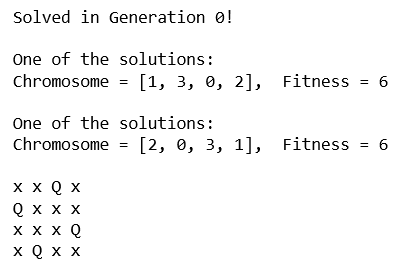

Unit Testing: for 8 queen problem, below is an output

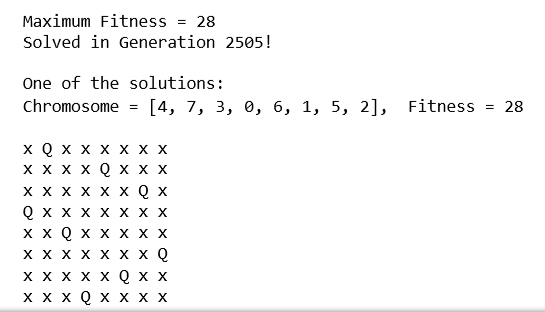

In [ ]:
import requests 
url='https://lf8q0kx152.execute-api.us-east-2.amazonaws.com/default/computeFitnessScore' 
x=requests.post(url,json={"qconfig":"4 7 3 0 6 1 5 2","userID":176766,"githubLink":"https://github.com/HariR14/8queens.git"}) 
print (x.text) 
print (x)